# Name : Muhammad Danish Zaheer Awan
# REG id : 25280092
## Task 1 - Inductive Biases and Feature Representations

## Imports and runtime setup

In [217]:
# Import standard Python, plotting, image, array, and PyTorch utilities.
# Locate the project root so notebook imports work from either project directory.
import json
import random
import sys
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.display import display
from PIL import Image
from torch.utils.data import DataLoader, Dataset

In [218]:
working_directory = Path.cwd().resolve()
project_root = next(
    (path for path in (working_directory, *working_directory.parents)
     if (path / 'task1').is_dir() and (path / 'Data').is_dir()),
    None,
)
if project_root is None:
    raise RuntimeError('Run this notebook from inside the PA_1 project.')
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

In [219]:
# Import the reusable metric, stability, and representation-analysis functions.
# These functions convert model outputs into the evidence required by Task 1.

from task1.analysis.evaluate_bias import (
    calculate_classification_metrics,
    calculate_clip_zero_shot_logits,
    calculate_cue_conflict_metrics,
    calculate_per_class_accuracy,
    categorize_cue_conflict_predictions,
    compare_transformation_with_clean,
    create_zero_shot_prompts,
    get_predictions_and_confidences,
    make_json_serializable,
    save_metrics,
    summarize_translation_results,
)
from task1.analysis.feature_similarity import (
    compare_prediction_and_feature_stability,
    summarize_feature_stability,
    summarize_translation_feature_stability,
)
from task1.analysis.representation import (
    fit_combined_tsne,
    save_projection_results,
)

In [220]:
# Import the saved Task 1 paths, constants, and full configuration module.
# These settings keep all notebook stages consistent with the assignment protocol.

from task1.configs import task1_config
from task1.configs.task1_config import (
    CONFIG_SNAPSHOT_FILE,
    CUE_CONFLICT_REVIEW_FILE,
    CUE_CONFLICT_STYLE_STRENGTH,
    FEATURE_BATCH_SIZE,
    FEATURE_CACHE_DIR,
    FIGURES_DIR,
    HUE_ROTATION_DEGREES,
    METRICS_DIR,
    NUM_WORKERS,
    OUTPUT_DIRECTORIES,
    PATCH_GRID_SIZE,
    PREDICTIONS_DIR,
    PROJECT_ROOT,
    SEED,
    SPLITS_DIR,
    STL10_CLASSES,
    TRANSLATION_DIRECTIONS,
    TRANSLATION_PIXELS,
)

In [221]:
# Import dataset splitting, interventions, and cue-conflict generation utilities.
# Image changes remain separate from model evaluation and normalization.

from task1.data.make_cue_conflicts import (
    create_review_summary,
    generate_cue_conflict_candidates,
    load_accepted_cue_conflicts,
)
from task1.data.make_subset import get_labels, prepare_stl10_splits
from task1.data.transforms import (
    apply_grayscale,
    apply_hue_rotation,
    apply_patch_shuffle,
    apply_translation,
    create_patch_permutation,
    prepare_common_image,
)

In [222]:
# Import backbone construction and linear-head training or prediction utilities.
# These modules provide the trainable and frozen model components used below.

from task1.models.backbones import build_backbone
from task1.models.linear_probe import (
    predict_linear_head,
    train_or_load_linear_head,
)

assert PROJECT_ROOT.resolve() == project_root

### Reproducibility and experiment record

In [223]:
# Define deterministic seeds, output folders, and automatic CUDA selection.
# This setup is called once before loading data or building any model.

def configure_runtime():
    random.seed(SEED)
    np.random.seed(SEED)
    torch.manual_seed(SEED)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    for output_directory in OUTPUT_DIRECTORIES:
        output_directory.mkdir(parents=True, exist_ok=True)
    return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [224]:
# Collect the fixed Task 1 settings and user-written hypotheses.
# Save them as JSON so every generated result has a reproducible configuration.

def save_run_configuration(device, hypotheses):
    configured_values = {
        name: value
        for name, value in vars(task1_config).items()
        if name.isupper()
    }
    run_configuration = {
        'task1_config': make_json_serializable(configured_values),
        'device': str(device),
        'representation_translation_pixels': [
            displacement
            for displacement in TRANSLATION_PIXELS
            if displacement != 0
        ],
        'representation_translation_directions': list(
            TRANSLATION_DIRECTIONS
        ),
        'hypotheses': hypotheses,
    }
    with CONFIG_SNAPSHOT_FILE.open('w', encoding='utf-8') as file:
        json.dump(run_configuration, file, indent=2)
    return run_configuration

In [225]:
# Initialize the runtime and hypotheses for all representation tests.
# Save the configuration snapshot and print the selected CPU or GPU environment.

DEVICE = configure_runtime()
HYPOTHESES = {
'Pre-knowledge:': 'The dataset stratification will be giving equal oppurtunity so there will not be a bias of class imbalance in any performance measure'
    'The CNNs will be more of a textured biased and ViTs will be more of a shape biased as the ClIP is based on ViTs, i am expecting it to'
    'behave the same way. The tranformation we will be applying that will affect images by permutation and translation will affect the performance'
    'scores of the models however CNNs will be more affected by permutation and translation will affect the ViTs more.'
}
RUN_CONFIGURATION = save_run_configuration(DEVICE, HYPOTHESES)

print(f'Project root: {PROJECT_ROOT}')
print(f'PyTorch: {torch.__version__}')
print(f'Device: {DEVICE}')
if DEVICE.type == 'cuda':
    print(f'GPU: {torch.cuda.get_device_name(0)}')
if any(value.startswith('TODO') for value in HYPOTHESES.values()):
    print('Reminder: replace every TODO hypothesis before interpreting results.')

Project root: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1
PyTorch: 2.11.0+cu128
Device: cuda
GPU: NVIDIA GeForce RTX 3060 Laptop GPU


## Dataset and saved splits

In [226]:
# Load STL-10 and create or reuse the deterministic assignment splits.
# Return the datasets, indices, test labels, and saved image identifiers together.

def load_task1_data():
    train_dataset, test_dataset, split_data = prepare_stl10_splits(
        download=True,
        overwrite=False,
    )
    train_indices = split_data['indices']['train']
    validation_indices = split_data['indices']['validation']
    test_indices = split_data['indices']['test']
    test_identifiers = [
        record['identifier'] for record in split_data['test_image_identifiers']
    ]
    test_labels_all = get_labels(test_dataset)
    test_labels = test_labels_all[np.asarray(test_indices, dtype=np.int64)]
    return {
        'train_dataset': train_dataset,
        'test_dataset': test_dataset,
        'split_data': split_data,
        'train_indices': train_indices,
        'validation_indices': validation_indices,
        'test_indices': test_indices,
        'test_identifiers': test_identifiers,
        'test_labels': test_labels,
    }

In [227]:
# Load the datasets and unpack all saved split information into clear variables.
# Display split sizes and sample identifiers before any feature extraction.

TASK1_DATA = load_task1_data()
train_dataset = TASK1_DATA['train_dataset']
test_dataset = TASK1_DATA['test_dataset']
split_data = TASK1_DATA['split_data']
TRAIN_INDICES = TASK1_DATA['train_indices']
VALIDATION_INDICES = TASK1_DATA['validation_indices']
TEST_INDICES = TASK1_DATA['test_indices']
TEST_IDENTIFIERS = TASK1_DATA['test_identifiers']
TEST_LABELS = TASK1_DATA['test_labels']

split_summary = pd.DataFrame({
    'split': ['train', 'validation', 'test'],
    'number_of_examples': [
        len(TRAIN_INDICES), len(VALIDATION_INDICES), len(TEST_INDICES)
    ],
})
display(split_summary)

Using the existing saved STL-10 split.
Dataset: STL10
Seed: 6304
Training examples: 4000
Validation examples: 1000
Selected test examples: 500
Test class counts: {'airplane': 50, 'bird': 50, 'car': 50, 'cat': 50, 'deer': 50, 'dog': 50, 'horse': 50, 'monkey': 50, 'ship': 50, 'truck': 50}
Saved split file: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\splits\stl10_splits_seed6304.json


,split,number_of_examples
0,train,4000
1,validation,1000
2,test,500


## Frozen backbones and linear classifier heads

In [228]:
# Convert an original dataset image to the common 224 by 224 RGB format.
# This clean version is created before applying model-specific normalization.

def clean_image_builder(image, official_index):
    return prepare_common_image(image)

In [229]:
# Define a dataset adapter for selected official STL-10 image indices.
# It applies one intervention and then the current backbone's normalization.

class OfficialImageSubset(Dataset):
    def __init__(self, dataset, indices, identifiers, image_builder, normalizer):
        if len(indices) != len(identifiers):
            raise ValueError('Indices and identifiers must have the same length.')
        self.dataset = dataset
        self.indices = [int(index) for index in indices]
        self.identifiers = [str(identifier) for identifier in identifiers]
        self.image_builder = image_builder
        self.normalizer = normalizer

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, position):
        official_index = self.indices[position]
        image, label = self.dataset[official_index]
        transformed_image = self.image_builder(image, official_index)
        common_image = prepare_common_image(transformed_image)
        return (
            self.normalizer(common_image),
            int(label),
            self.identifiers[position],
        )

In [230]:
# Define a dataset adapter for cue-conflict images saved on disk.
# It preserves the reviewed order, labels, and identifiers during feature extraction.

class PathImageDataset(Dataset):
    def __init__(self, image_paths, labels, identifiers, normalizer):
        if not (len(image_paths) == len(labels) == len(identifiers)):
            raise ValueError('Cue-conflict paths, labels, and identifiers must align.')
        self.image_paths = [Path(path) for path in image_paths]
        self.labels = np.asarray(labels, dtype=np.int64)
        self.identifiers = [str(identifier) for identifier in identifiers]
        self.normalizer = normalizer

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, position):
        with Image.open(self.image_paths[position]) as image:
            common_image = prepare_common_image(image.convert('RGB'))
        return (
            self.normalizer(common_image),
            int(self.labels[position]),
            self.identifiers[position],
        )

### Feature-cache helpers

In [231]:
# Convert a model or condition name into a stable lowercase filename component.
# This keeps cached feature filenames predictable across notebook runs.

def safe_filename(value):
    safe_value = str(value).lower()
    for character in (' ', '-', '/', '\\', '.'):
        safe_value = safe_value.replace(character, '_')
    return '_'.join(part for part in safe_value.split('_') if part)

In [232]:
# Construct the feature-cache path for one backbone and image condition.
# Separate names prevent clean and transformed representations from being mixed.

def feature_cache_file(backbone_name, condition_name):
    filename = f'{safe_filename(backbone_name)}__{safe_filename(condition_name)}.npz'
    return FEATURE_CACHE_DIR / filename

In [233]:
# Save extracted features, labels, and ordered identifiers in one compressed file.
# The stored metadata is later used to verify exact image alignment.

def save_feature_bundle(bundle, output_file):
    output_file.parent.mkdir(parents=True, exist_ok=True)
    np.savez_compressed(
        output_file,
        features=np.asarray(bundle['features'], dtype=np.float32),
        labels=np.asarray(bundle['labels'], dtype=np.int64),
        identifiers=np.asarray(bundle['identifiers'], dtype=str),
    )

In [234]:
# Load a previously saved feature bundle without allowing pickled objects.
# Return consistent NumPy types for features, labels, and identifiers.

def load_feature_bundle(input_file):
    with np.load(input_file, allow_pickle=False) as saved_data:
        return {
            'features': saved_data['features'].astype(np.float32),
            'labels': saved_data['labels'].astype(np.int64),
            'identifiers': saved_data['identifiers'].astype(str).tolist(),
        }

In [235]:
# Check feature shape, finite values, labels, and identifier ordering.
# This prevents a stale or mismatched cache from entering an experiment.

def validate_feature_bundle(bundle, expected_labels, expected_identifiers):
    features = np.asarray(bundle['features'])
    labels = np.asarray(bundle['labels'], dtype=np.int64)
    identifiers = [str(identifier) for identifier in bundle['identifiers']]
    if features.ndim != 2 or len(features) == 0:
        raise ValueError('A feature cache must contain a non-empty feature matrix.')
    if not np.isfinite(features).all():
        raise ValueError('A feature cache contains a non-finite value.')
    if not np.array_equal(labels, np.asarray(expected_labels, dtype=np.int64)):
        raise ValueError('Cached feature labels do not match the requested images.')
    if identifiers != [str(value) for value in expected_identifiers]:
        raise ValueError('Cached feature identifiers do not match the requested order.')

In [236]:
# Run a frozen backbone over one prepared dataset in ordered GPU batches.
# Move the resulting representations to CPU and keep their labels and identifiers.

@torch.inference_mode()
def extract_feature_bundle(backbone, prepared_dataset):
    data_loader = DataLoader(
        prepared_dataset,
        batch_size=FEATURE_BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=DEVICE.type == 'cuda',
    )
    feature_batches = []
    label_batches = []
    identifiers = []
    backbone.to(DEVICE)
    backbone.eval()
    try:
        for image_batch, label_batch, identifier_batch in data_loader:
            image_batch = image_batch.to(DEVICE, non_blocking=True)
            feature_batches.append(backbone(image_batch).float().cpu())
            label_batches.append(label_batch.cpu())
            identifiers.extend(str(value) for value in identifier_batch)
    finally:
        backbone.to('cpu')
        if DEVICE.type == 'cuda':
            torch.cuda.empty_cache()
    return {
        'features': torch.cat(feature_batches).numpy(),
        'labels': torch.cat(label_batches).numpy(),
        'identifiers': identifiers,
    }

In [237]:
# Reuse a compatible feature cache or rebuild it with the frozen backbone.
# Validate both cached and newly extracted features before returning them.

def extract_or_load_features(
    backbone,
    backbone_name,
    condition_name,
    prepared_dataset,
    expected_labels,
    expected_identifiers,
    overwrite=False,
):
    cache_file = feature_cache_file(backbone_name, condition_name)
    if cache_file.exists() and not overwrite:
        cached_bundle = load_feature_bundle(cache_file)
        try:
            validate_feature_bundle(
                cached_bundle, expected_labels, expected_identifiers
            )
            if cached_bundle['features'].shape[1] != backbone.feature_dimension:
                raise ValueError('Cached feature dimension is incompatible.')
            print(f'Loaded features: {cache_file.name}')
            return cached_bundle
        except ValueError:
            print(f'Rebuilding stale feature cache: {cache_file.name}')
    bundle = extract_feature_bundle(backbone, prepared_dataset)
    validate_feature_bundle(bundle, expected_labels, expected_identifiers)
    if bundle['features'].shape[1] != backbone.feature_dimension:
        raise ValueError('Extracted feature dimension is incompatible.')
    save_feature_bundle(bundle, cache_file)
    print(f'Saved features: {cache_file.name}')
    return bundle

In [238]:
# Extract the same official-image condition for ResNet, ViT, and CLIP.
# Each backbone receives identical transformed pixels before its own normalization.

def extract_official_condition(
    condition_name, dataset, indices, identifiers, labels, image_builder
):
    condition_bundles = {}
    for backbone_name, backbone in BACKBONES.items():
        prepared_dataset = OfficialImageSubset(
            dataset, indices, identifiers, image_builder, backbone.normalization
        )
        condition_bundles[backbone_name] = extract_or_load_features(
            backbone,
            backbone_name,
            condition_name,
            prepared_dataset,
            labels,
            identifiers,
        )
    return condition_bundles

In [239]:
# Extract features from the accepted cue-conflict image files for every backbone.
# The shared paths and identifiers keep all three model evaluations aligned.

def extract_path_condition(condition_name, image_paths, labels, identifiers):
    condition_bundles = {}
    for backbone_name, backbone in BACKBONES.items():
        prepared_dataset = PathImageDataset(
            image_paths, labels, identifiers, backbone.normalization
        )
        condition_bundles[backbone_name] = extract_or_load_features(
            backbone,
            backbone_name,
            condition_name,
            prepared_dataset,
            labels,
            identifiers,
        )
    return condition_bundles

### Train or load the three linear heads

In [240]:
# Build one frozen backbone and obtain clean train, validation, and test features.
# Train or reload its linear head using only training and validation features.

def prepare_backbone_experiment(backbone_name, build_name):
    print(f'Preparing {backbone_name}')
    backbone = build_backbone(build_name, DEVICE)
    split_inputs = {
        'train': (train_dataset, TRAIN_INDICES, TRAIN_IDENTIFIERS, TRAIN_LABELS),
        'validation': (
            train_dataset,
            VALIDATION_INDICES,
            VALIDATION_IDENTIFIERS,
            VALIDATION_LABELS,
        ),
        'test': (test_dataset, TEST_INDICES, TEST_IDENTIFIERS, TEST_LABELS),
    }
    split_features = {}
    for split_name, values in split_inputs.items():
        dataset, indices, identifiers, labels = values
        prepared_dataset = OfficialImageSubset(
            dataset,
            indices,
            identifiers,
            clean_image_builder,
            backbone.normalization,
        )
        split_features[split_name] = extract_or_load_features(
            backbone,
            backbone_name,
            f'{split_name}_clean',
            prepared_dataset,
            labels,
            identifiers,
        )
    head, training_history, checkpoint = train_or_load_linear_head(
        backbone_name,
        split_features['train']['features'],
        TRAIN_LABELS,
        split_features['validation']['features'],
        VALIDATION_LABELS,
        device=DEVICE,
        overwrite=False,
    )
    return backbone.to('cpu'), head.to('cpu'), split_features, training_history, checkpoint

In [241]:
# Initialize shared model dictionaries and labels for the three experiments.
# Create stable train and validation identifiers used by the feature caches.

BACKBONE_BUILD_NAMES = {
    'resnet50': 'resnet50',
    'vit_b_16': 'vit_b_16',
    'clip': 'clip',
}
BACKBONES = {}
HEADS = {}
SPLIT_FEATURES = {}
TRAINING_HISTORIES = {}
HEAD_CHECKPOINTS = {}
train_labels_all = get_labels(train_dataset)
TRAIN_LABELS = train_labels_all[np.asarray(TRAIN_INDICES, dtype=np.int64)]
VALIDATION_LABELS = train_labels_all[np.asarray(VALIDATION_INDICES, dtype=np.int64)]
TRAIN_IDENTIFIERS = [f'train_{index:05d}' for index in TRAIN_INDICES]
VALIDATION_IDENTIFIERS = [f'train_{index:05d}' for index in VALIDATION_INDICES]

#### ResNet-50 features and linear head

In [242]:
# Prepare ResNet-50 clean features and its validation-selected linear head.
# Store the backbone, head, caches, history, and checkpoint for later stages.

resnet_outputs = prepare_backbone_experiment('resnet50', 'resnet50')
BACKBONES['resnet50'] = resnet_outputs[0]
HEADS['resnet50'] = resnet_outputs[1]
SPLIT_FEATURES['resnet50'] = resnet_outputs[2]
TRAINING_HISTORIES['resnet50'] = resnet_outputs[3]
HEAD_CHECKPOINTS['resnet50'] = resnet_outputs[4]

Preparing resnet50
Backbone: resnet50
Feature dimension: 2048
Total parameters: 23,508,032
Trainable backbone parameters: 0
Loaded features: resnet50__train_clean.npz
Loaded features: resnet50__validation_clean.npz
Loaded features: resnet50__test_clean.npz
Loaded existing linear head: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\checkpoints\resnet50_linear_head_seed6304.pt


#### ViT-B/16 features and linear head

In [243]:
# Prepare ViT-B/16 clean features and its validation-selected linear head.
# Store the backbone, head, caches, history, and checkpoint for later stages.

vit_outputs = prepare_backbone_experiment('vit_b_16', 'vit_b_16')
BACKBONES['vit_b_16'] = vit_outputs[0]
HEADS['vit_b_16'] = vit_outputs[1]
SPLIT_FEATURES['vit_b_16'] = vit_outputs[2]
TRAINING_HISTORIES['vit_b_16'] = vit_outputs[3]
HEAD_CHECKPOINTS['vit_b_16'] = vit_outputs[4]

Preparing vit_b_16
Backbone: vit_b_16
Feature dimension: 768
Total parameters: 85,798,656
Trainable backbone parameters: 0
Loaded features: vit_b_16__train_clean.npz
Loaded features: vit_b_16__validation_clean.npz
Loaded features: vit_b_16__test_clean.npz
Loaded existing linear head: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\checkpoints\vit_b_16_linear_head_seed6304.pt


#### CLIP features and linear head

In [244]:
# Prepare CLIP image features and its validation-selected linear head.
# Store the backbone, head, caches, history, and checkpoint for later stages.

clip_outputs = prepare_backbone_experiment('clip', 'clip')
BACKBONES['clip'] = clip_outputs[0]
HEADS['clip'] = clip_outputs[1]
SPLIT_FEATURES['clip'] = clip_outputs[2]
TRAINING_HISTORIES['clip'] = clip_outputs[3]
HEAD_CHECKPOINTS['clip'] = clip_outputs[4]

Preparing clip


c:\Users\DanishZaheer\anaconda3\envs\ATML\Lib\site-packages\open_clip\factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


Backbone: ViT-B-32
Feature dimension: 512
Total parameters: 151,277,313
Trainable backbone parameters: 0
Loaded features: clip__train_clean.npz
Loaded features: clip__validation_clean.npz
Loaded features: clip__test_clean.npz
Loaded existing linear head: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\checkpoints\clip_linear_head_seed6304.pt


### Prepare fixed-prompt CLIP zero-shot classification

In [245]:
# Encode the ten fixed text prompts with the frozen CLIP text encoder.
# Also retain CLIP's learned scale for all zero-shot similarity logits.

def prepare_clip_zero_shot(backbone):
    backbone.to(DEVICE)
    with torch.inference_mode():
        text_features = backbone.encode_text(
            create_zero_shot_prompts(), DEVICE
        ).cpu()
        logit_scale = backbone.get_logit_scale().cpu()
    backbone.to('cpu')
    if DEVICE.type == 'cuda':
        torch.cuda.empty_cache()
    return text_features, logit_scale

In [246]:
# Compute the fixed CLIP text features and define predictor-to-backbone mappings.
# These names are reused consistently in every result and prediction table.

CLIP_TEXT_FEATURES, CLIP_LOGIT_SCALE = prepare_clip_zero_shot(BACKBONES['clip'])

PREDICTOR_BACKBONES = {
    'resnet50_linear': 'resnet50',
    'vit_b_16_linear': 'vit_b_16',
    'clip_linear': 'clip',
    'clip_zero_shot': 'clip',
}
PREDICTOR_DISPLAY_NAMES = {
    'resnet50_linear': 'ResNet-50 + linear head',
    'vit_b_16_linear': 'ViT-B/16 + linear head',
    'clip_linear': 'CLIP + linear head',
    'clip_zero_shot': 'CLIP zero-shot',
}

### Shared prediction helpers

In [247]:
# Calculate logits for three trained linear heads and fixed-prompt zero-shot CLIP.
# All four predictors operate on the aligned features for one image condition.

def calculate_all_logits(feature_bundles):
    logits = {}
    for backbone_name in BACKBONE_BUILD_NAMES:
        predictor_name = f'{backbone_name}_linear'
        if backbone_name == 'clip':
            predictor_name = 'clip_linear'
        logits[predictor_name] = predict_linear_head(
            HEADS[backbone_name],
            feature_bundles[backbone_name]['features'],
            device=DEVICE,
        )
    logits['clip_zero_shot'] = calculate_clip_zero_shot_logits(
        feature_bundles['clip']['features'],
        CLIP_TEXT_FEATURES,
        CLIP_LOGIT_SCALE,
    ).cpu().numpy()
    return logits

In [248]:
# Combine identifiers, true labels, predictions, and confidence into one table.
# Create separate prediction columns for every evaluated model variant.

def build_prediction_table(identifiers, labels, logits_by_predictor):
    labels = np.asarray(labels, dtype=np.int64)
    prediction_table = pd.DataFrame(
        {
            'image_identifier': identifiers,
            'label_index': labels,
            'class_name': [STL10_CLASSES[index] for index in labels],
        }
    )
    for predictor_name, logits in logits_by_predictor.items():
        predictions, confidences = get_predictions_and_confidences(logits)
        prediction_table[f'{predictor_name}_prediction_index'] = predictions
        prediction_table[f'{predictor_name}_prediction_class'] = [
            STL10_CLASSES[index] for index in predictions
        ]
        prediction_table[f'{predictor_name}_confidence'] = confidences
    return prediction_table

In [249]:
# Build and save the per-image predictions for one experimental condition.
# Return the table so the current notebook stage can display or extend it.

def save_prediction_table(condition_name, identifiers, labels, logits):
    prediction_table = build_prediction_table(identifiers, labels, logits)
    output_file = PREDICTIONS_DIR / f'{safe_filename(condition_name)}.csv'
    prediction_table.to_csv(output_file, index=False)
    return prediction_table

## 1. Clean baseline and zero-shot CLIP

In [250]:
# Evaluate all four predictors on clean train, validation, and test features.
# Keep the test outputs as the official baseline used by subsequent experiments.

CLEAN_SPLIT_LABELS = {
    "train": TRAIN_LABELS,
    "validation": VALIDATION_LABELS,
    "test": TEST_LABELS,
}

CLEAN_SPLIT_IDENTIFIERS = {
    "train": TRAIN_IDENTIFIERS,
    "validation": VALIDATION_IDENTIFIERS,
    "test": TEST_IDENTIFIERS,
}

CLEAN_SPLIT_FEATURES = {}
CLEAN_SPLIT_LOGITS = {}
CLEAN_SPLIT_RESULTS = {}
CLEAN_SPLIT_PREDICTIONS = {}

for split_name in ("train", "validation", "test"):
    feature_bundles = {
        backbone_name: SPLIT_FEATURES[backbone_name][split_name]
        for backbone_name in BACKBONE_BUILD_NAMES
    }

    split_logits = calculate_all_logits(feature_bundles)
    split_labels = CLEAN_SPLIT_LABELS[split_name]
    split_identifiers = CLEAN_SPLIT_IDENTIFIERS[split_name]

    split_results = {}
    for predictor_name, logits in split_logits.items():
        split_results[predictor_name] = {
            "classification": calculate_classification_metrics(
                logits,
                split_labels,
            ),
            "per_class_accuracy": calculate_per_class_accuracy(
                logits,
                split_labels,
            ),
        }

    # Keep the original clean.csv filename for the official test predictions.
    prediction_filename = (
        "clean" if split_name == "test"
        else f"{split_name}_clean"
    )

    CLEAN_SPLIT_FEATURES[split_name] = feature_bundles
    CLEAN_SPLIT_LOGITS[split_name] = split_logits
    CLEAN_SPLIT_RESULTS[split_name] = split_results
    CLEAN_SPLIT_PREDICTIONS[split_name] = save_prediction_table(
        prediction_filename,
        split_identifiers,
        split_labels,
        split_logits,
    )

# Save metrics for all three clean-data splits.
save_metrics(
    CLEAN_SPLIT_RESULTS,
    METRICS_DIR / "clean_all_splits.json",
)

# Preserve the original test aliases used by later notebook cells.
CLEAN_FEATURES = CLEAN_SPLIT_FEATURES["test"]
CLEAN_LOGITS = CLEAN_SPLIT_LOGITS["test"]
CLEAN_RESULTS = CLEAN_SPLIT_RESULTS["test"]
CLEAN_PREDICTIONS = CLEAN_SPLIT_PREDICTIONS["test"]

# Preserve the assignment's official clean test-baseline file.
save_metrics(
    CLEAN_RESULTS,
    METRICS_DIR / "clean_baseline.json",
)

# Compile one table containing train, validation, and test metrics.
clean_table_rows = []

for split_name, split_results in CLEAN_SPLIT_RESULTS.items():
    for predictor_name, predictor_results in split_results.items():
        clean_table_rows.append(
            {
                "split": split_name,
                "model": PREDICTOR_DISPLAY_NAMES[predictor_name],
                **predictor_results["classification"],
            }
        )

clean_table = pd.DataFrame(clean_table_rows)
display(clean_table)

,split,model,accuracy,macro_f1,mean_max_confidence
0,train,ResNet-50 + linear head,0.99575,0.995748,0.957325
1,train,ViT-B/16 + linear head,0.99975,0.999750,0.984367
2,train,CLIP + linear head,0.97775,0.977673,0.335860
3,train,CLIP zero-shot,0.95700,0.956283,0.941763
4,validation,ResNet-50 + linear head,0.97400,0.974052,0.945903
5,validation,ViT-B/16 + linear head,0.98000,0.980004,0.972007
6,validation,CLIP + linear head,0.98700,0.986962,0.333580
7,validation,CLIP zero-shot,0.96300,0.962295,0.938681
8,test,ResNet-50 + linear head,0.97800,0.978036,0.943872
9,test,ViT-B/16 + linear head,0.97400,0.973916,0.965951


## 4. Color interventions

In [251]:
# Extract features and predictions for one controlled color intervention.
# Compare it with each model's clean baseline and save per-image predictions.

def run_color_condition(condition_name, cache_name, image_builder):
    features = extract_official_condition(
        f'test_{cache_name}',
        test_dataset,
        TEST_INDICES,
        TEST_IDENTIFIERS,
        TEST_LABELS,
        image_builder,
    )
    logits = calculate_all_logits(features)
    results = {
        predictor_name: compare_transformation_with_clean(
            CLEAN_LOGITS[predictor_name], transformed_logits, TEST_LABELS
        )
        for predictor_name, transformed_logits in logits.items()
    }
    predictions = save_prediction_table(
        condition_name, TEST_IDENTIFIERS, TEST_LABELS, logits
    )
    return features, logits, results, predictions

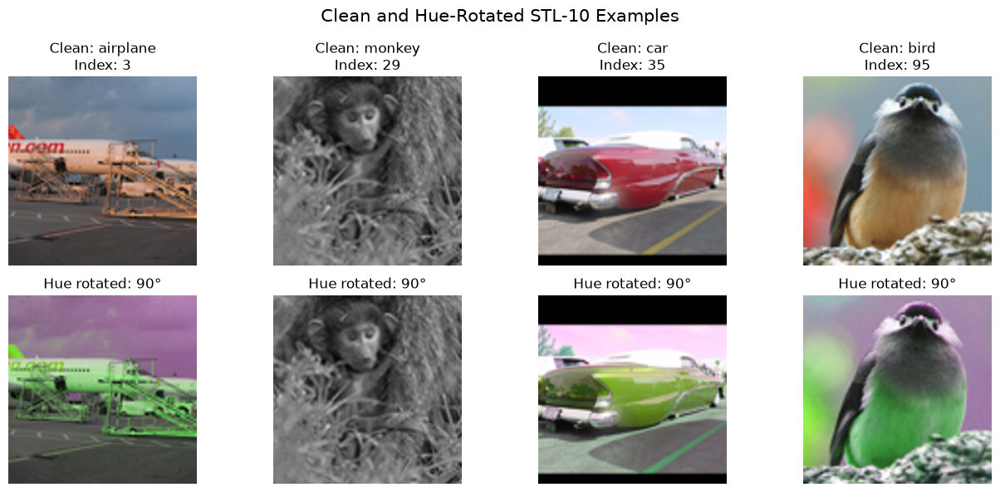

Saved hue examples: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\figures\hue_rotation_90_degrees_examples.png


In [289]:
# Display four clean test images beside their fixed hue-rotated versions.
# Save the visual evidence in the Task 1 results/figures directory.

selected_examples = []
selected_classes = set()

for official_index in TEST_INDICES:
    image, label = test_dataset[official_index]
    label = int(label)

    if label not in selected_classes:
        selected_examples.append(
            {
                "image": prepare_common_image(image),
                "label": label,
                "official_index": official_index,
            }
        )
        selected_classes.add(label)

    if len(selected_examples) == 4:
        break

figure, axes = plt.subplots(
    2,
    4,
    figsize=(13, 6),
)

for column, example in enumerate(selected_examples):
    clean_image = example["image"]
    hue_image = apply_hue_rotation(
        clean_image,
        degrees=HUE_ROTATION_DEGREES,
    )
    class_name = STL10_CLASSES[example["label"]]

    axes[0, column].imshow(clean_image)
    axes[0, column].set_title(
        f"Clean: {class_name}\n"
        f"Index: {example['official_index']}"
    )
    axes[0, column].axis("off")

    axes[1, column].imshow(hue_image)
    axes[1, column].set_title(
        f"Hue rotated: {HUE_ROTATION_DEGREES:g}°"
    )
    axes[1, column].axis("off")

figure.suptitle(
    "Clean and Hue-Rotated STL-10 Examples",
    fontsize=15,
)

figure.tight_layout()

hue_example_file = (
    FIGURES_DIR
    / f"hue_rotation_{HUE_ROTATION_DEGREES:g}_degrees_examples.png"
)

hue_example_file.parent.mkdir(
    parents=True,
    exist_ok=True,
)

figure.savefig(
    hue_example_file,
    dpi=300,
    bbox_inches="tight",
)

plt.show()
print(f"Saved hue examples: {hue_example_file}")

### 2.1 Grayscale

In [253]:
# Run the grayscale intervention and compare it against clean predictions.
# Store its features, logits, metrics, predictions, and displayed model table.

COLOR_FEATURES = {}
COLOR_LOGITS = {}
COLOR_RESULTS = {}

grayscale_outputs = run_color_condition(
    'grayscale',
    'grayscale',
    lambda image, index: apply_grayscale(image),
)
COLOR_FEATURES['grayscale'] = grayscale_outputs[0]
COLOR_LOGITS['grayscale'] = grayscale_outputs[1]
COLOR_RESULTS['grayscale'] = grayscale_outputs[2]
display(pd.DataFrame([
    {'model': PREDICTOR_DISPLAY_NAMES[name], **metrics}
    for name, metrics in COLOR_RESULTS['grayscale'].items()
]))

Loaded features: resnet50__test_grayscale.npz
Loaded features: vit_b_16__test_grayscale.npz
Loaded features: clip__test_grayscale.npz


,model,accuracy,macro_f1,mean_max_confidence,accuracy_change,macro_f1_change,mean_max_confidence_change,prediction_consistency
0,ResNet-50 + linear head,0.958,0.957837,0.939620,-0.020,-0.020198,-0.004253,0.966
1,ViT-B/16 + linear head,0.956,0.955905,0.961289,-0.018,-0.018011,-0.004661,0.956
2,CLIP + linear head,0.954,0.953605,0.307417,-0.028,-0.028370,-0.026953,0.958
3,CLIP zero-shot,0.942,0.941118,0.927429,-0.026,-0.026406,-0.015269,0.952


### 2.2 Fixed hue rotation

In [254]:
# Run the fixed hue-rotation intervention using the configured angle.
# Save the completed color results and display this condition's model metrics.

hue_cache_name = f'hue_rotation_{HUE_ROTATION_DEGREES:g}_degrees'
hue_outputs = run_color_condition(
    'hue_rotation',
    hue_cache_name,
    lambda image, index: apply_hue_rotation(image, HUE_ROTATION_DEGREES),
)
COLOR_FEATURES['hue_rotation'] = hue_outputs[0]
COLOR_LOGITS['hue_rotation'] = hue_outputs[1]
COLOR_RESULTS['hue_rotation'] = hue_outputs[2]
save_metrics(COLOR_RESULTS, METRICS_DIR / 'color_interventions.json')
display(pd.DataFrame([
    {'model': PREDICTOR_DISPLAY_NAMES[name], **metrics}
    for name, metrics in COLOR_RESULTS['hue_rotation'].items()
]))

Loaded features: resnet50__test_hue_rotation_90_degrees.npz
Loaded features: vit_b_16__test_hue_rotation_90_degrees.npz
Loaded features: clip__test_hue_rotation_90_degrees.npz


,model,accuracy,macro_f1,mean_max_confidence,accuracy_change,macro_f1_change,mean_max_confidence_change,prediction_consistency
0,ResNet-50 + linear head,0.938,0.937787,0.922382,-0.040,-0.040249,-0.021490,0.944
1,ViT-B/16 + linear head,0.944,0.943977,0.936822,-0.030,-0.029939,-0.029129,0.946
2,CLIP + linear head,0.938,0.937701,0.291833,-0.044,-0.044275,-0.042537,0.940
3,CLIP zero-shot,0.928,0.926371,0.919358,-0.040,-0.041153,-0.023340,0.934


## 3. Shape-texture cue conflicts

### 3.1 Generate candidates without model predictions

In [255]:
# Generate or reload balanced AdaIN cue-conflict candidates without predictions.
# Display accepted, rejected, and pending visual-review counts before evaluation.

CUE_REVIEW = generate_cue_conflict_candidates(
    test_dataset,
    split_data,
    device=DEVICE,
    download_weights=True,
    overwrite=False,
)
CUE_REVIEW_SUMMARY = create_review_summary(CUE_REVIEW)
display(pd.DataFrame([CUE_REVIEW_SUMMARY]).drop(columns='pair_direction_counts'))
CUE_READY = CUE_REVIEW_SUMMARY['pending_count'] == 0

Using existing cue-conflict candidates and visual-review table.


,seed,source_implementation,style_strength,visual_rejection_rule,minimum_required_valid_images,candidate_count,pending_count,accepted_count,rejected_count,minimum_valid_requirement_met
0,6304,https://github.com/naoto0804/pytorch-AdaIN,0.8,Reject an image if the content object is no lo...,200,300,0,233,67,True


### 3.2 Manual visual-review checkpoint

In [256]:
# Check whether any generated cue-conflict candidates still need visual review.
# Print the review-file location and required manual actions when work remains.

if not CUE_READY:
    print(f'Pause here and review: {CUE_CONFLICT_REVIEW_FILE}')
    print('Mark every row accepted or rejected and add rejection reasons.')

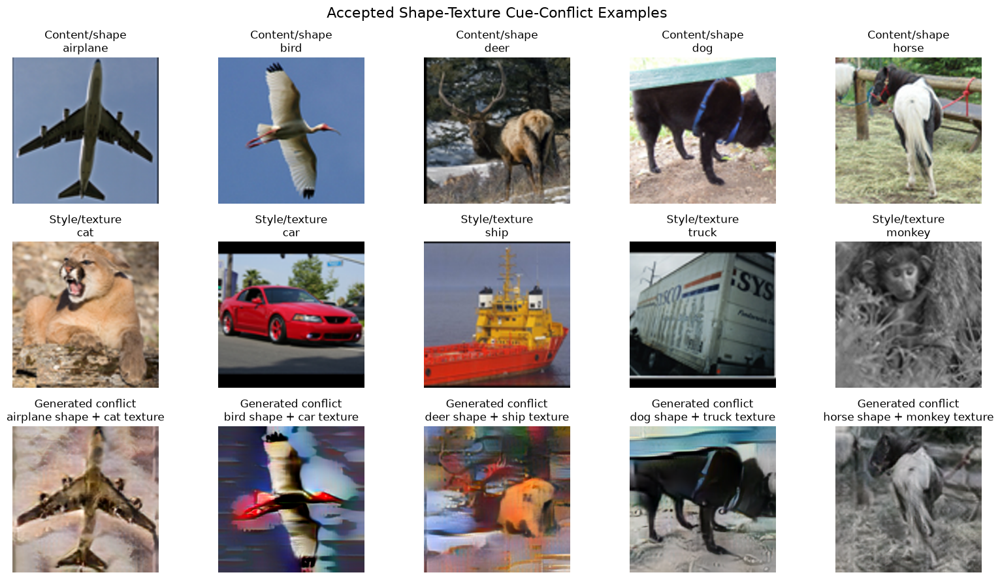

Saved cue-conflict examples: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\figures\accepted_cue_conflict_generation_examples.png


In [290]:
# Display one accepted cue conflict from each configured class pair.
# Compare the original content, original style, and generated AdaIN image.

accepted_review = load_accepted_cue_conflicts()

cue_examples = (
    accepted_review
    .groupby("class_pair", sort=False)
    .head(1)
    .head(5)
    .reset_index(drop=True)
)

number_of_examples = len(cue_examples)

figure, axes = plt.subplots(
    3,
    number_of_examples,
    figsize=(3.2 * number_of_examples, 9),
)

for column, (_, record) in enumerate(cue_examples.iterrows()):
    content_image, _ = test_dataset[int(record["content_index"])]
    style_image, _ = test_dataset[int(record["style_index"])]

    content_image = prepare_common_image(content_image)
    style_image = prepare_common_image(style_image)

    cue_image_path = PROJECT_ROOT / record["output_file"]
    with Image.open(cue_image_path) as opened_image:
        cue_image = prepare_common_image(
            opened_image.convert("RGB")
        )

    axes[0, column].imshow(content_image)
    axes[0, column].set_title(
        f"Content/shape\n{record['content_class']}"
    )
    axes[0, column].axis("off")

    axes[1, column].imshow(style_image)
    axes[1, column].set_title(
        f"Style/texture\n{record['style_class']}"
    )
    axes[1, column].axis("off")

    axes[2, column].imshow(cue_image)
    axes[2, column].set_title(
        f"Generated conflict\n"
        f"{record['content_class']} shape + "
        f"{record['style_class']} texture"
    )
    axes[2, column].axis("off")

figure.suptitle(
    "Accepted Shape-Texture Cue-Conflict Examples",
    fontsize=16,
)

figure.tight_layout()

cue_example_file = (
    FIGURES_DIR
    / "accepted_cue_conflict_generation_examples.png"
)

cue_example_file.parent.mkdir(
    parents=True,
    exist_ok=True,
)

figure.savefig(
    cue_example_file,
    dpi=300,
    bbox_inches="tight",
)

plt.show()
print(f"Saved cue-conflict examples: {cue_example_file}")

### 3.3 Evaluate only the accepted conflicts

In [258]:
# Load only visually accepted cue conflicts after validating the review file.
# Return aligned content labels, style labels, identifiers, and image paths.

def load_accepted_cue_data():
    accepted_review = load_accepted_cue_conflicts()
    identifiers = accepted_review['conflict_id'].astype(str).tolist()
    content_labels = accepted_review[
        'content_label_index'
    ].to_numpy(dtype=np.int64)
    style_labels = accepted_review[
        'style_label_index'
    ].to_numpy(dtype=np.int64)
    image_paths = [
        PROJECT_ROOT / output_file
        for output_file in accepted_review['output_file']
    ]
    return accepted_review, identifiers, content_labels, style_labels, image_paths

In [259]:
# Extract features for accepted conflicts and their original content images.
# These paired representations support clean-versus-conflict stability analysis.

def extract_cue_feature_pairs(
    accepted_review, identifiers, content_labels, image_paths
):
    cache_name = f'cue_conflict_alpha_{CUE_CONFLICT_STYLE_STRENGTH:g}'
    cue_features = extract_path_condition(
        cache_name,
        image_paths,
        content_labels,
        identifiers,
    )
    clean_features = extract_official_condition(
        'cue_content_clean',
        test_dataset,
        accepted_review['content_index'].tolist(),
        identifiers,
        content_labels,
        clean_image_builder,
    )
    return cue_features, clean_features

In [260]:
# Predict accepted conflicts and count shape, texture, and other decisions.
# Save shape bias, coverage, and the visual-review counts for every predictor.

def calculate_cue_results(cue_features, clean_features, content_labels, style_labels):
    cue_logits = calculate_all_logits(cue_features)
    clean_logits = calculate_all_logits(clean_features)
    results = {}
    for predictor_name, logits in cue_logits.items():
        predictions, _ = get_predictions_and_confidences(logits)
        results[predictor_name] = calculate_cue_conflict_metrics(
            predictions, content_labels, style_labels
        )
    results['visual_review'] = CUE_REVIEW_SUMMARY
    save_metrics(results, METRICS_DIR / 'cue_conflict_results.json')
    return cue_logits, clean_logits, results

In [261]:
# Create the detailed per-image cue-conflict prediction table.
# Attach content/style metadata and each model's shape-texture decision category.

def build_cue_prediction_table(
    accepted_review, identifiers, content_labels, style_labels, cue_logits
):
    predictions_table = build_prediction_table(
        identifiers, content_labels, cue_logits
    ).rename(columns={
        'label_index': 'content_label_index',
        'class_name': 'content_class',
    })
    predictions_table.insert(3, 'style_label_index', style_labels)
    predictions_table.insert(
        4,
        'style_class',
        [STL10_CLASSES[index] for index in style_labels],
    )
    predictions_table.insert(
        5, 'output_file', accepted_review['output_file'].tolist()
    )
    for predictor_name, logits in cue_logits.items():
        predictions, _ = get_predictions_and_confidences(logits)
        predictions_table[f'{predictor_name}_cue'] = (
            categorize_cue_conflict_predictions(
                predictions, content_labels, style_labels
            )
        )
    predictions_table.to_csv(
        PREDICTIONS_DIR / 'cue_conflicts.csv', index=False
    )
    return predictions_table

In [262]:
# Run cue-conflict feature extraction and evaluation only when review is complete.
# Display shape bias and coverage, or clearly report why evaluation was skipped.

if CUE_READY:
    cue_data = load_accepted_cue_data()
    ACCEPTED_CUE_REVIEW = cue_data[0]
    CUE_IDENTIFIERS = cue_data[1]
    CUE_CONTENT_LABELS = cue_data[2]
    CUE_STYLE_LABELS = cue_data[3]
    cue_image_paths = cue_data[4]
    CUE_FEATURES, CUE_CLEAN_FEATURES = extract_cue_feature_pairs(
        ACCEPTED_CUE_REVIEW,
        CUE_IDENTIFIERS,
        CUE_CONTENT_LABELS,
        cue_image_paths,
    )
    CUE_LOGITS, CUE_CLEAN_LOGITS, CUE_RESULTS = calculate_cue_results(
        CUE_FEATURES,
        CUE_CLEAN_FEATURES,
        CUE_CONTENT_LABELS,
        CUE_STYLE_LABELS,
    )
    CUE_PREDICTIONS = build_cue_prediction_table(
        ACCEPTED_CUE_REVIEW,
        CUE_IDENTIFIERS,
        CUE_CONTENT_LABELS,
        CUE_STYLE_LABELS,
        CUE_LOGITS,
    )
    display(pd.DataFrame([
        {'model': PREDICTOR_DISPLAY_NAMES[name], **metrics}
        for name, metrics in CUE_RESULTS.items()
        if name != 'visual_review'
    ]))
else:
    print('Evaluation skipped until the visual review is complete.')

Loaded features: resnet50__cue_conflict_alpha_0_8.npz
Loaded features: vit_b_16__cue_conflict_alpha_0_8.npz
Loaded features: clip__cue_conflict_alpha_0_8.npz
Loaded features: resnet50__cue_content_clean.npz
Loaded features: vit_b_16__cue_content_clean.npz
Loaded features: clip__cue_content_clean.npz


,model,shape_count,texture_count,other_count,total_count,shape_bias_percent,coverage_percent
0,ResNet-50 + linear head,115,38,80,233,75.163399,65.665236
1,ViT-B/16 + linear head,169,11,53,233,93.888889,77.253219
2,CLIP + linear head,173,7,53,233,96.111111,77.253219
3,CLIP zero-shot,182,5,46,233,97.326203,80.257511


## 4. Translation sensitivity

In [263]:
# Create an image function for one displacement and cardinal direction.
# The returned function applies reflection-padded translation consistently.

def make_translation_builder(displacement, direction):
    def translation_builder(image, official_index):
        return apply_translation(image, displacement, direction)
    return translation_builder

In [264]:
# Extract features and logits for every required translation and direction.
# Organize outputs by displacement so later cells can average across directions.

def extract_translation_conditions():
    TRANSLATION_FEATURES = {name: {} for name in BACKBONE_BUILD_NAMES}
    TRANSLATION_LOGITS = {name: {} for name in PREDICTOR_BACKBONES}
    for displacement in TRANSLATION_PIXELS:
        if displacement == 0:
            continue
        for direction in TRANSLATION_DIRECTIONS:
            condition_name = f'translation_{displacement}_{direction}'
            condition_features = extract_official_condition(
                f'test_{condition_name}',
                test_dataset,
                TEST_INDICES,
                TEST_IDENTIFIERS,
                TEST_LABELS,
                make_translation_builder(displacement, direction),
            )
            condition_logits = calculate_all_logits(condition_features)
            for backbone_name in BACKBONE_BUILD_NAMES:
                TRANSLATION_FEATURES[backbone_name].setdefault(
                    displacement, {}
                )[direction] = condition_features[backbone_name]['features']
            for predictor_name in PREDICTOR_BACKBONES:
                TRANSLATION_LOGITS[predictor_name].setdefault(
                    displacement, {}
                )[direction] = condition_logits[predictor_name]
    return TRANSLATION_FEATURES, TRANSLATION_LOGITS

In [265]:
# Calculate accuracy and prediction consistency at each displacement.
# Save both detailed direction results and compact curve values.

def summarize_translation_experiment(translation_features, translation_logits):
    translation_results = {
        predictor_name: summarize_translation_results(
            CLEAN_LOGITS[predictor_name], translated_logits, TEST_LABELS
        )
        for predictor_name, translated_logits in translation_logits.items()
    }
    save_metrics(translation_results, METRICS_DIR / 'translation_results.json')
    translation_rows = []
    for predictor_name, displacement_results in translation_results.items():
        for result in displacement_results:
            translation_rows.append(
                {
                    'model': PREDICTOR_DISPLAY_NAMES[predictor_name],
                    **{
                        key: value
                        for key, value in result.items()
                        if key != 'direction_results'
                    },
                }
            )
    TRANSLATION_TABLE = pd.DataFrame(translation_rows)
    TRANSLATION_TABLE.to_csv(
        METRICS_DIR / 'translation_curve_values.csv', index=False
    )
    return translation_results, TRANSLATION_TABLE

In [266]:
# Plot model accuracy and prediction consistency against displacement.
# Save the two-panel translation figure at report-ready resolution.

def plot_translation_curves(translation_results):
    figure, axes = plt.subplots(1, 2, figsize=(12, 4.5))
    for predictor_name, displacement_results in translation_results.items():
        displacements = [item['displacement'] for item in displacement_results]
        accuracies = [100.0 * item['accuracy'] for item in displacement_results]
        consistencies = [
            100.0 * item['prediction_consistency'] for item in displacement_results
        ]
        label = PREDICTOR_DISPLAY_NAMES[predictor_name]
        axes[0].plot(displacements, accuracies, marker='o', label=label)
        axes[1].plot(displacements, consistencies, marker='o', label=label)
    axes[0].set_title('Translation accuracy')
    axes[0].set_ylabel('Accuracy (%)')
    axes[1].set_title('Translation prediction consistency')
    axes[1].set_ylabel('Consistency (%)')
    for axis in axes:
        axis.set_xlabel('Displacement (pixels)')
        axis.set_xticks(TRANSLATION_PIXELS)
        axis.grid(alpha=0.3)
    axes[1].legend(bbox_to_anchor=(1.02, 1.0), loc='upper left')
    figure.tight_layout()
    figure.savefig(
        FIGURES_DIR / 'translation_curves.png', dpi=300, bbox_inches='tight'
    )
    return figure

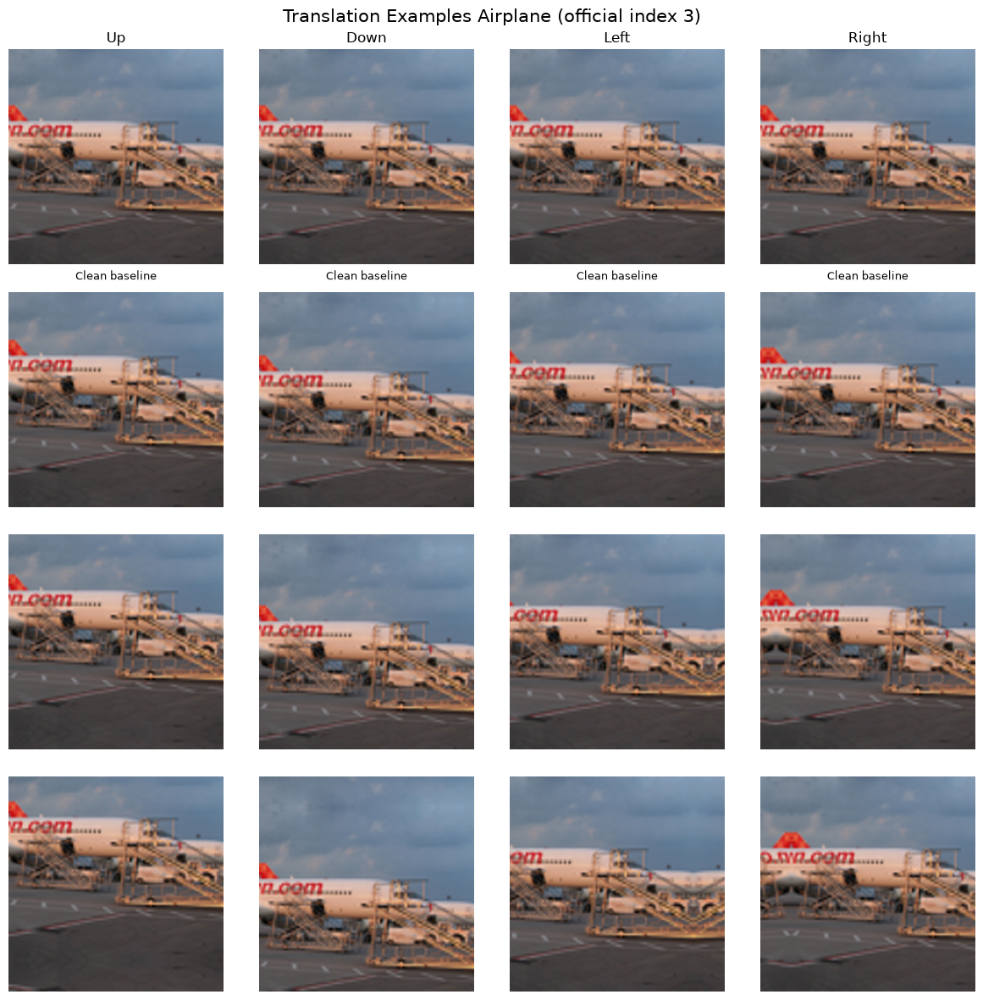

Saved translation examples: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\figures\translation_intervention_examples.png


In [291]:
# Visualize one test image at every translation displacement and direction.
# The grid mirrors the exact translation conditions used during evaluation.

example_official_index = TEST_INDICES[0]
example_image, example_label = test_dataset[example_official_index]

example_image = prepare_common_image(example_image)
example_class = STL10_CLASSES[int(example_label)]

figure, axes = plt.subplots(
    len(TRANSLATION_PIXELS),
    len(TRANSLATION_DIRECTIONS),
    figsize=(12, 12),
)

for row, displacement in enumerate(TRANSLATION_PIXELS):
    for column, direction in enumerate(TRANSLATION_DIRECTIONS):
        translated_image = apply_translation(
            example_image,
            displacement=displacement,
            direction=direction,
        )

        axis = axes[row, column]
        axis.imshow(translated_image)
        axis.axis("off")

        if row == 0:
            axis.set_title(direction.title(), fontsize=12)

        if column == 0:
            axis.set_ylabel(
                f"{displacement} pixels",
                fontsize=12,
            )

        if displacement == 0:
            axis.text(
                0.5,
                -0.07,
                "Clean baseline",
                transform=axis.transAxes,
                ha="center",
                fontsize=9,
            )

figure.suptitle(
    f"Translation Examples {example_class.title()} "
    f"(official index {example_official_index})",
    fontsize=15,
)

figure.tight_layout()

translation_example_file = (
    FIGURES_DIR
    / "translation_intervention_examples.png"
)

translation_example_file.parent.mkdir(
    parents=True,
    exist_ok=True,
)

figure.savefig(
    translation_example_file,
    dpi=300,
    bbox_inches="tight",
)

plt.show()
print(f"Saved translation examples: {translation_example_file}")

### Run translation extraction, metrics, and plotting

Loaded features: resnet50__test_translation_8_up.npz
Loaded features: vit_b_16__test_translation_8_up.npz
Loaded features: clip__test_translation_8_up.npz
Loaded features: resnet50__test_translation_8_down.npz
Loaded features: vit_b_16__test_translation_8_down.npz
Loaded features: clip__test_translation_8_down.npz
Loaded features: resnet50__test_translation_8_left.npz
Loaded features: vit_b_16__test_translation_8_left.npz
Loaded features: clip__test_translation_8_left.npz
Loaded features: resnet50__test_translation_8_right.npz
Loaded features: vit_b_16__test_translation_8_right.npz
Loaded features: clip__test_translation_8_right.npz
Loaded features: resnet50__test_translation_16_up.npz
Loaded features: vit_b_16__test_translation_16_up.npz
Loaded features: clip__test_translation_16_up.npz
Loaded features: resnet50__test_translation_16_down.npz
Loaded features: vit_b_16__test_translation_16_down.npz
Loaded features: clip__test_translation_16_down.npz
Loaded features: resnet50__test_trans

,model,displacement,accuracy,macro_f1,mean_max_confidence,accuracy_change,macro_f1_change,mean_max_confidence_change,prediction_consistency
0,ResNet-50 + linear head,0,0.9780,0.978036,0.943872,0.0000,0.000000,0.000000,1.0000
1,ResNet-50 + linear head,8,0.9765,0.976551,0.942986,-0.0015,-0.001485,-0.000886,0.9945
2,ResNet-50 + linear head,16,0.9710,0.971065,0.939959,-0.0070,-0.006970,-0.003913,0.9915
3,ResNet-50 + linear head,32,0.9675,0.967643,0.934879,-0.0105,-0.010393,-0.008993,0.9870
4,ViT-B/16 + linear head,0,0.9740,0.973916,0.965951,0.0000,0.000000,0.000000,1.0000
5,ViT-B/16 + linear head,8,0.9770,0.976983,0.965183,0.0030,0.003067,-0.000768,0.9840
6,ViT-B/16 + linear head,16,0.9735,0.973430,0.964399,-0.0005,-0.000486,-0.001552,0.9895
7,ViT-B/16 + linear head,32,0.9645,0.964530,0.959252,-0.0095,-0.009385,-0.006699,0.9735
8,CLIP + linear head,0,0.9820,0.981975,0.334370,0.0000,0.000000,0.000000,1.0000
9,CLIP + linear head,8,0.9805,0.980474,0.331739,-0.0015,-0.001501,-0.002631,0.9855


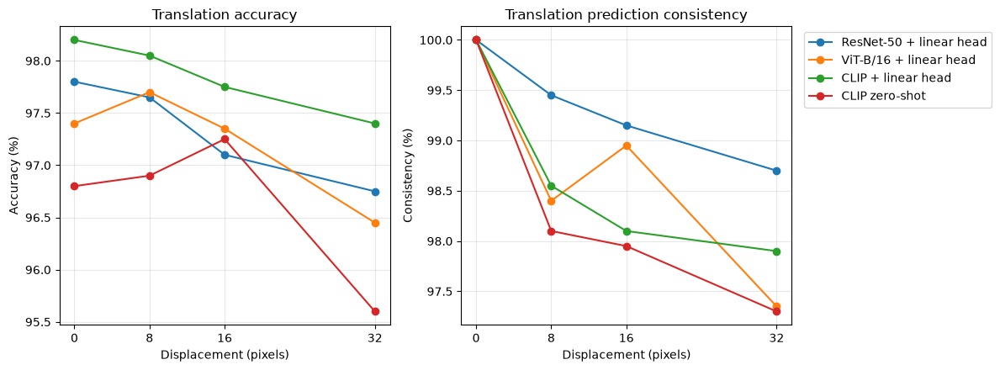

In [268]:
# Execute all translation feature extraction, summarization, and plotting steps.
# Display both the numeric curve table and the saved translation figure.

TRANSLATION_FEATURES, TRANSLATION_LOGITS = extract_translation_conditions()
TRANSLATION_RESULTS, TRANSLATION_TABLE = summarize_translation_experiment(
    TRANSLATION_FEATURES, TRANSLATION_LOGITS
)
display(TRANSLATION_TABLE)
TRANSLATION_FIGURE = plot_translation_curves(TRANSLATION_RESULTS)

## 5. Patch-structure intervention

In [269]:
# Create and record one deterministic non-identity patch order per test image.
# Saving these permutations proves that every model receives the same shuffle.

def save_patch_permutations():
    PATCH_PERMUTATION_FILE = (
        SPLITS_DIR / f'patch_permutations_seed{SEED}.json'
    )
    patch_permutation_records = [
        {
            'image_identifier': identifier,
            'official_index': int(official_index),
            'grid_size': PATCH_GRID_SIZE,
            'permutation': create_patch_permutation(official_index),
        }
        for identifier, official_index in zip(TEST_IDENTIFIERS, TEST_INDICES)
    ]
    with PATCH_PERMUTATION_FILE.open('w', encoding='utf-8') as file:
        json.dump(patch_permutation_records, file, indent=2)
    return PATCH_PERMUTATION_FILE, patch_permutation_records

In [270]:
# Apply the recorded seed-based 4 by 4 patch shuffle to one image.
# Return only the transformed image for subsequent model normalization.

def patch_shuffle_builder(image, official_index):
    shuffled_image, _ = apply_patch_shuffle(image, official_index)
    return shuffled_image

In [271]:
# Extract patch-shuffled features and compare predictions with the clean baseline.
# Save patch metrics, detailed predictions, and a compact model table.

def run_patch_experiment():
    PATCH_FEATURES = extract_official_condition(
        f'test_patch_shuffle_{PATCH_GRID_SIZE}x{PATCH_GRID_SIZE}_seed{SEED}',
        test_dataset,
        TEST_INDICES,
        TEST_IDENTIFIERS,
        TEST_LABELS,
        patch_shuffle_builder,
    )
    PATCH_LOGITS = calculate_all_logits(PATCH_FEATURES)
    PATCH_RESULTS = {
        predictor_name: compare_transformation_with_clean(
            CLEAN_LOGITS[predictor_name], transformed_logits, TEST_LABELS
        )
        for predictor_name, transformed_logits in PATCH_LOGITS.items()
    }
    save_metrics(PATCH_RESULTS, METRICS_DIR / 'patch_shuffle_results.json')
    save_prediction_table(
        'patch_shuffle', TEST_IDENTIFIERS, TEST_LABELS, PATCH_LOGITS
    )
    patch_table = pd.DataFrame(
        [
            {
                'model': PREDICTOR_DISPLAY_NAMES[predictor_name],
                **metrics,
            }
            for predictor_name, metrics in PATCH_RESULTS.items()
        ]
    )
    return PATCH_FEATURES, PATCH_LOGITS, PATCH_RESULTS, patch_table

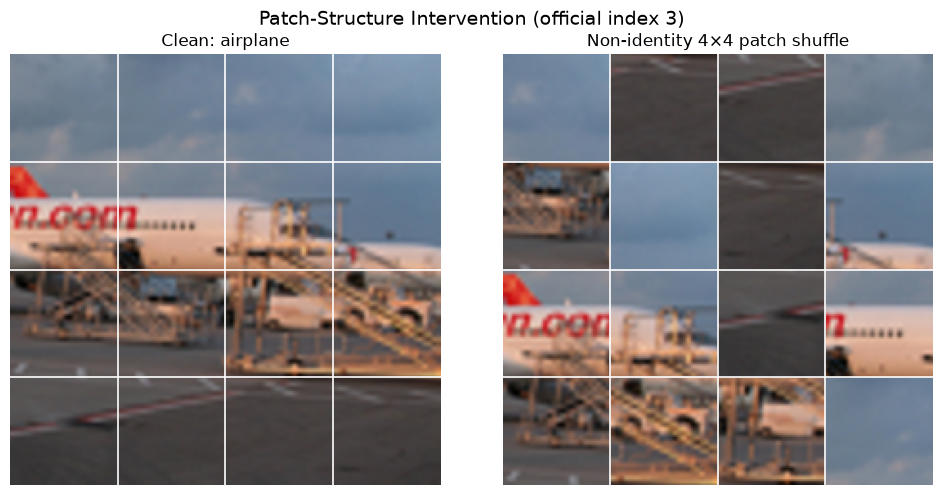

Identity permutation:
[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]
 [12 13 14 15]]

Applied non-identity permutation:
[[ 2 14 13  0]
 [ 9  3 15  7]
 [ 4  6 12  5]
 [ 8 11 10  1]]

Saved patch example: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\figures\patch_shuffle_non_identity_example.png


In [292]:
# Visualize one clean test image and its deterministic non-identity patch shuffle.
# Draw the 4 by 4 patch boundaries and save the example as report evidence.

example_official_index = TEST_INDICES[0]
example_image, example_label = test_dataset[example_official_index]

clean_image = prepare_common_image(example_image)

shuffled_image, patch_permutation = apply_patch_shuffle(
    clean_image,
    image_index=example_official_index,
)

identity_permutation = list(
    range(PATCH_GRID_SIZE * PATCH_GRID_SIZE)
)

assert patch_permutation != identity_permutation
assert sorted(patch_permutation) == identity_permutation

figure, axes = plt.subplots(
    1,
    2,
    figsize=(10, 5),
)

axes[0].imshow(clean_image)
axes[0].set_title(
    f"Clean: {STL10_CLASSES[int(example_label)]}"
)

axes[1].imshow(shuffled_image)
axes[1].set_title(
    f"Non-identity {PATCH_GRID_SIZE}\u00d7{PATCH_GRID_SIZE} "
    "patch shuffle"
)

image_width = clean_image.size[0]
patch_width = image_width // PATCH_GRID_SIZE

for axis in axes:
    for patch_boundary in range(1, PATCH_GRID_SIZE):
        boundary_position = (
            patch_boundary * patch_width - 0.5
        )

        axis.axvline(
            boundary_position,
            color="white",
            linewidth=1.2,
        )
        axis.axhline(
            boundary_position,
            color="white",
            linewidth=1.2,
        )

    axis.axis("off")

figure.suptitle(
    f"Patch-Structure Intervention "
    f"(official index {example_official_index})",
    fontsize=14,
)

figure.tight_layout()

patch_example_file = (
    FIGURES_DIR
    / "patch_shuffle_non_identity_example.png"
)

patch_example_file.parent.mkdir(
    parents=True,
    exist_ok=True,
)

figure.savefig(
    patch_example_file,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Identity permutation:")
print(
    np.asarray(identity_permutation).reshape(
        PATCH_GRID_SIZE,
        PATCH_GRID_SIZE,
    )
)

print("\nApplied non-identity permutation:")
print(
    np.asarray(patch_permutation).reshape(
        PATCH_GRID_SIZE,
        PATCH_GRID_SIZE,
    )
)

print(f"\nSaved patch example: {patch_example_file}")

### Save permutations, then run the patch experiment

In [273]:
# Save deterministic patch permutations and run the patch-shuffle experiment.
# Display the resulting accuracy changes and prediction-consistency table.

PATCH_PERMUTATION_FILE, PATCH_PERMUTATIONS = save_patch_permutations()
PATCH_FEATURES, PATCH_LOGITS, PATCH_RESULTS, patch_table = (
    run_patch_experiment()
)
display(patch_table)

Loaded features: resnet50__test_patch_shuffle_4x4_seed6304.npz
Loaded features: vit_b_16__test_patch_shuffle_4x4_seed6304.npz
Loaded features: clip__test_patch_shuffle_4x4_seed6304.npz


,model,accuracy,macro_f1,mean_max_confidence,accuracy_change,macro_f1_change,mean_max_confidence_change,prediction_consistency
0,ResNet-50 + linear head,0.906,0.906431,0.897004,-0.072,-0.071604,-0.046868,0.922
1,ViT-B/16 + linear head,0.892,0.892426,0.898036,-0.082,-0.081490,-0.067915,0.908
2,CLIP + linear head,0.806,0.805430,0.215295,-0.176,-0.176546,-0.119074,0.806
3,CLIP zero-shot,0.794,0.792128,0.773652,-0.174,-0.175396,-0.169046,0.796


## 6. Representation analysis

In [274]:
# Stop representation analysis if the visual cue-conflict review is unfinished.
# This protects the experiment from using unreviewed or prediction-filtered images.

if not CUE_READY:
    raise RuntimeError(
        'Complete the visual-only cue-conflict review before this section.'
    )

In [275]:
# Pair clean and transformed features for every required representation test.
# Include every non-zero translation displacement and cardinal direction.

def build_representation_conditions(backbone_name):
    conditions = {
        'grayscale': (
            CLEAN_FEATURES[backbone_name]['features'],
            COLOR_FEATURES['grayscale'][backbone_name]['features'],
            TEST_LABELS,
            TEST_IDENTIFIERS,
        ),
        'cue_conflict': (
            CUE_CLEAN_FEATURES[backbone_name]['features'],
            CUE_FEATURES[backbone_name]['features'],
            CUE_CONTENT_LABELS,
            CUE_IDENTIFIERS,
        ),
        'patch_shuffle': (
            CLEAN_FEATURES[backbone_name]['features'],
            PATCH_FEATURES[backbone_name]['features'],
            TEST_LABELS,
            TEST_IDENTIFIERS,
        ),
    }

    for displacement in TRANSLATION_PIXELS:
        if displacement == 0:
            continue
        for direction in TRANSLATION_DIRECTIONS:
            condition_name = f'translation_{displacement}_{direction}'
            conditions[condition_name] = (
                CLEAN_FEATURES[backbone_name]['features'],
                TRANSLATION_FEATURES[backbone_name]
                [displacement][direction],
                TEST_LABELS,
                TEST_IDENTIFIERS,
            )

    return conditions

In [276]:
# Calculate cosine stability for one clean-transformed feature pairing.
# Fit, name, and save its combined t-SNE projection with progress output.

def analyze_representation_condition(backbone_name, condition_name, values):
    print(f'Running t-SNE: {backbone_name} / {condition_name}')
    clean_features, transformed_features, labels, identifiers = values
    stability = summarize_feature_stability(
        clean_features,
        transformed_features,
        labels=labels,
        clean_identifiers=identifiers,
        transformed_identifiers=identifiers,
    )
    projection_data, projection_settings = fit_combined_tsne(
        clean_features,
        transformed_features,
        labels,
        identifiers,
        transformed_condition=condition_name,
    )
    saved_projection = save_projection_results(
        projection_data,
        projection_settings,
        backbone_name,
        condition_name,
        output_directory=representation_directory,
    )
    plt.close(saved_projection['figure'])
    print(f"Saved t-SNE: {saved_projection['figure_file'].name}")
    return stability

In [277]:
# Run every representation condition for one frozen visual backbone.
# Also summarize translation feature stability across all four directions.

def analyze_backbone_representations(backbone_name):
    conditions = build_representation_conditions(backbone_name)
    FEATURE_STABILITY[backbone_name] = {}
    for condition_name, values in conditions.items():
        FEATURE_STABILITY[backbone_name][condition_name] = (
            analyze_representation_condition(
                backbone_name, condition_name, values
            )
        )
    TRANSLATION_FEATURE_STABILITY[backbone_name] = (
        summarize_translation_feature_stability(
            CLEAN_FEATURES[backbone_name]['features'],
            TRANSLATION_FEATURES[backbone_name],
        )
    )

In [278]:
# Pair clean and transformed logits used in representation comparisons.
# Include every non-zero translation displacement and cardinal direction.

def build_prediction_condition_logits():
    prediction_condition_logits = {
        'grayscale': (CLEAN_LOGITS, COLOR_LOGITS['grayscale']),
        'cue_conflict': (CUE_CLEAN_LOGITS, CUE_LOGITS),
        'patch_shuffle': (CLEAN_LOGITS, PATCH_LOGITS),
    }

    for displacement in TRANSLATION_PIXELS:
        if displacement == 0:
            continue
        for direction in TRANSLATION_DIRECTIONS:
            condition_name = f'translation_{displacement}_{direction}'
            prediction_condition_logits[condition_name] = (
                CLEAN_LOGITS,
                {
                    predictor_name: TRANSLATION_LOGITS[predictor_name]
                    [displacement][direction]
                    for predictor_name in PREDICTOR_BACKBONES
                },
            )

    return prediction_condition_logits

In [279]:
# Compare feature movement for unchanged and changed model predictions.
# Repeat this analysis across all interventions and translation settings.

def compare_predictor_representations(
    predictor_name, backbone_name, prediction_condition_logits
):
    global PREDICTION_FEATURE_COMPARISON
    PREDICTION_FEATURE_COMPARISON[predictor_name] = {}

    for condition_name, logits_pair in prediction_condition_logits.items():
        clean_condition_logits, transformed_condition_logits = logits_pair

        if condition_name == 'cue_conflict':
            clean_features = CUE_CLEAN_FEATURES[backbone_name]['features']
            transformed_features = CUE_FEATURES[backbone_name]['features']
        elif condition_name == 'grayscale':
            clean_features = CLEAN_FEATURES[backbone_name]['features']
            transformed_features = COLOR_FEATURES['grayscale'][
                backbone_name
            ]['features']
        elif condition_name == 'patch_shuffle':
            clean_features = CLEAN_FEATURES[backbone_name]['features']
            transformed_features = PATCH_FEATURES[backbone_name]['features']
        elif condition_name.startswith('translation_'):
            _, displacement_text, direction = condition_name.split(
                '_',
                maxsplit=2,
            )
            displacement = int(displacement_text)
            clean_features = CLEAN_FEATURES[backbone_name]['features']
            transformed_features = TRANSLATION_FEATURES[backbone_name][
                displacement
            ][direction]
        else:
            raise ValueError(
                f'Unknown representation condition: {condition_name}'
            )

        clean_predictions, _ = get_predictions_and_confidences(
            clean_condition_logits[predictor_name]
        )
        transformed_predictions, _ = get_predictions_and_confidences(
            transformed_condition_logits[predictor_name]
        )
        PREDICTION_FEATURE_COMPARISON[predictor_name][condition_name] = (
            compare_prediction_and_feature_stability(
                clean_features,
                transformed_features,
                clean_predictions,
                transformed_predictions,
            )
        )

In [280]:
# Save feature-stability and prediction-feature comparison results as JSON.
# Build a compact table containing each backbone and intervention summary.

def save_representation_results():
    REPRESENTATION_RESULTS = {
        'feature_stability': FEATURE_STABILITY,
        'translation_feature_stability': TRANSLATION_FEATURE_STABILITY,
        'prediction_feature_comparison': PREDICTION_FEATURE_COMPARISON,
    }
    save_metrics(
        REPRESENTATION_RESULTS, METRICS_DIR / 'representation_stability.json'
    )
    stability_table = pd.DataFrame(
        [
            {
                'backbone': backbone_name,
                'condition': condition_name,
                **results['overall'],
            }
            for backbone_name, conditions in FEATURE_STABILITY.items()
            for condition_name, results in conditions.items()
        ]
    )
    return stability_table

### Run feature stability, t-SNE, and prediction-feature comparisons

In [281]:
# Run cosine stability, combined t-SNE, and prediction-feature comparisons.
# Save all representation outputs and display the compact stability table.

FEATURE_STABILITY = {}
TRANSLATION_FEATURE_STABILITY = {}
representation_directory = FIGURES_DIR / 'representations'
PREDICTION_FEATURE_COMPARISON = {}

for backbone_name in BACKBONE_BUILD_NAMES:
    analyze_backbone_representations(backbone_name)
prediction_condition_logits = build_prediction_condition_logits()
for predictor_name, backbone_name in PREDICTOR_BACKBONES.items():
    compare_predictor_representations(
        predictor_name, backbone_name, prediction_condition_logits
    )
stability_table = save_representation_results()
display(stability_table)

Running t-SNE: resnet50 / grayscale
Saved t-SNE: resnet50_grayscale_tsne.png
Running t-SNE: resnet50 / cue_conflict
Saved t-SNE: resnet50_cue_conflict_tsne.png
Running t-SNE: resnet50 / patch_shuffle
Saved t-SNE: resnet50_patch_shuffle_tsne.png
Running t-SNE: resnet50 / translation_8_up
Saved t-SNE: resnet50_translation_8_up_tsne.png
Running t-SNE: resnet50 / translation_8_down
Saved t-SNE: resnet50_translation_8_down_tsne.png
Running t-SNE: resnet50 / translation_8_left
Saved t-SNE: resnet50_translation_8_left_tsne.png
Running t-SNE: resnet50 / translation_8_right
Saved t-SNE: resnet50_translation_8_right_tsne.png
Running t-SNE: resnet50 / translation_16_up
Saved t-SNE: resnet50_translation_16_up_tsne.png
Running t-SNE: resnet50 / translation_16_down
Saved t-SNE: resnet50_translation_16_down_tsne.png
Running t-SNE: resnet50 / translation_16_left
Saved t-SNE: resnet50_translation_16_left_tsne.png
Running t-SNE: resnet50 / translation_16_right
Saved t-SNE: resnet50_translation_16_right_

,backbone,condition,number_of_examples,cosine_stability,standard_deviation,median,minimum,maximum
0,resnet50,grayscale,500,0.788441,0.097823,0.798730,0.301468,1.000000
1,resnet50,cue_conflict,233,0.364129,0.168072,0.356174,0.056445,0.766010
2,resnet50,patch_shuffle,500,0.718113,0.072038,0.720603,0.445369,0.884667
3,resnet50,translation_8_up,500,0.969208,0.014400,0.972052,0.867109,0.990853
4,resnet50,translation_8_down,500,0.965526,0.018488,0.969343,0.835037,0.993509
5,resnet50,translation_8_left,500,0.973791,0.013903,0.976783,0.911244,0.994439
6,resnet50,translation_8_right,500,0.965598,0.021775,0.971609,0.855511,0.993121
7,resnet50,translation_16_up,500,0.955915,0.023934,0.961161,0.792013,0.988331
8,resnet50,translation_16_down,500,0.949303,0.030264,0.956079,0.776195,0.988043
9,resnet50,translation_16_left,500,0.960794,0.022165,0.966219,0.826194,0.991845


## Result compilation and failure cases

In [282]:
# Stop final compilation if the cue-conflict evaluation has not been completed.
# This ensures every required evidence table is available before aggregation.

if not CUE_READY:
    raise RuntimeError('Cue-conflict review and evaluation are not complete.')

In [283]:
# Combine clean, color, and patch-shuffle performance for all predictors.
# Save the required compact comparison as a machine-readable CSV table.

def build_compact_performance_table():
    rows = []
    for predictor_name in PREDICTOR_BACKBONES:
        clean_metrics = CLEAN_RESULTS[predictor_name]['classification']
        rows.append({
            'model': PREDICTOR_DISPLAY_NAMES[predictor_name],
            'condition': 'clean',
            **clean_metrics,
            'accuracy_change': 0.0,
            'prediction_consistency': 1.0,
        })
        for condition_name in ('grayscale', 'hue_rotation'):
            rows.append({
                'model': PREDICTOR_DISPLAY_NAMES[predictor_name],
                'condition': condition_name,
                **COLOR_RESULTS[condition_name][predictor_name],
            })
        rows.append({
            'model': PREDICTOR_DISPLAY_NAMES[predictor_name],
            'condition': 'patch_shuffle',
            **PATCH_RESULTS[predictor_name],
        })
    result_table = pd.DataFrame(rows)
    result_table.to_csv(
        METRICS_DIR / 'compact_performance_table.csv', index=False
    )
    return result_table

In [284]:
# Convert the cue-conflict summary dictionaries into one model comparison table.
# Save shape, texture, other, bias, and coverage values as CSV.

def build_cue_results_table():
    result_table = pd.DataFrame([
        {
            'model': PREDICTOR_DISPLAY_NAMES[predictor_name],
            **metrics,
        }
        for predictor_name, metrics in CUE_RESULTS.items()
        if predictor_name != 'visual_review'
    ])
    result_table.to_csv(
        METRICS_DIR / 'cue_conflict_table.csv', index=False
    )
    return result_table

In [285]:
# Select a fixed number of cue-conflict rows satisfying one analysis mask.
# Attach the selection reason so examples remain interpretable later.

def select_examples(mask, reason, count):
    selected = CUE_PREDICTIONS.loc[mask].head(count).copy()
    selected.insert(0, 'selection_reason', reason)
    return selected

In [286]:
# Build two separate 3 by 3 cue-conflict evidence groups.
# Apply the same deterministic selection categories to both pair directions.

def build_direction_examples(
    content_class,
    style_class,
    cue_category_columns,
    unanimous_mask,
    disagreement_mask,
    other_mask,
    example_count=9,
):
    direction_mask = (
        CUE_PREDICTIONS['content_class'].eq(content_class)
        & CUE_PREDICTIONS['style_class'].eq(style_class)
    )
    selected_parts = []
    selected_identifiers = set()

    def append_examples(mask, reason, count):
        available_mask = (
            direction_mask
            & mask
            & ~CUE_PREDICTIONS['image_identifier'].isin(
                selected_identifiers
            )
        )
        selected = select_examples(
            available_mask,
            reason,
            count,
        )
        selected_parts.append(selected)
        selected_identifiers.update(
            selected['image_identifier'].tolist()
        )

    append_examples(
        unanimous_mask
        & CUE_PREDICTIONS[cue_category_columns[0]].eq('shape'),
        'unanimous shape decision',
        2,
    )
    append_examples(
        unanimous_mask
        & CUE_PREDICTIONS[cue_category_columns[0]].eq('texture'),
        'unanimous texture decision',
        2,
    )
    append_examples(
        disagreement_mask,
        'model disagreement',
        5,
    )
    append_examples(
        other_mask,
        'at least one other-label decision',
        2,
    )

    selected_count = sum(len(part) for part in selected_parts)
    if selected_count < example_count:
        append_examples(
            pd.Series(True, index=CUE_PREDICTIONS.index),
            'additional accepted direction example',
            example_count - selected_count,
        )

    direction_examples = pd.concat(
        selected_parts,
        ignore_index=True,
    ).head(example_count)

    if len(direction_examples) != example_count:
        raise RuntimeError(
            f'Only {len(direction_examples)} informative examples were '
            f'available for {content_class} shape / {style_class} texture.'
        )

    return direction_examples.reset_index(drop=True)


def build_informative_examples():
    cue_category_columns = [
        f'{predictor_name}_cue' for predictor_name in PREDICTOR_BACKBONES
    ]
    category_counts = CUE_PREDICTIONS[cue_category_columns].nunique(axis=1)
    unanimous_mask = category_counts == 1
    disagreement_mask = category_counts > 1
    other_mask = CUE_PREDICTIONS[cue_category_columns].eq('other').any(axis=1)

    example_groups = {
        'airplane_shape_cat_texture': build_direction_examples(
            'airplane',
            'cat',
            cue_category_columns,
            unanimous_mask,
            disagreement_mask,
            other_mask,
        ),
        'cat_shape_airplane_texture': build_direction_examples(
            'cat',
            'airplane',
            cue_category_columns,
            unanimous_mask,
            disagreement_mask,
            other_mask,
        ),
    }

    for group_name, examples in example_groups.items():
        examples.to_csv(
            PREDICTIONS_DIR / f'informative_{group_name}.csv',
            index=False,
        )

    combined_examples = pd.concat(
        example_groups.values(),
        ignore_index=True,
    )
    combined_examples.to_csv(
        PREDICTIONS_DIR / 'informative_cue_conflict_examples.csv',
        index=False,
    )
    return example_groups

In [287]:
# Create one separate 3 by 3 visual grid for each cue-conflict direction.
# Save and return both figures while preserving their selection explanations.

def plot_example_group(examples, figure_title, output_filename):
    figure, axes = plt.subplots(
        3,
        3,
        figsize=(12, 12),
    )
    axes = axes.ravel()

    for axis, (_, example) in zip(axes, examples.iterrows()):
        with Image.open(PROJECT_ROOT / example['output_file']) as image:
            axis.imshow(image.convert('RGB'))
        axis.set_title(
            f"{example['content_class']} shape / "
            f"{example['style_class']} texture\n"
            f"{example['selection_reason']}",
            fontsize=9,
        )
        axis.axis('off')

    for axis in axes[len(examples):]:
        axis.axis('off')

    figure.suptitle(
        figure_title,
        fontsize=15,
    )
    figure.tight_layout(rect=(0, 0, 1, 0.97))
    figure.savefig(
        FIGURES_DIR / output_filename,
        dpi=300,
        bbox_inches='tight',
    )
    return figure


def plot_informative_examples(example_groups):
    figure_specs = {
        'airplane_shape_cat_texture': {
            'title': 'Airplane Shape / Cat Texture Examples',
            'filename': 'informative_cue_conflicts.png',
        },
        'cat_shape_airplane_texture': {
            'title': 'Cat Shape / Airplane Texture Examples',
            'filename': (
                'informative_cat_shape_airplane_texture.png'
            ),
        },
    }

    figures = {}
    for group_name, examples in example_groups.items():
        specs = figure_specs[group_name]
        figures[group_name] = plot_example_group(
            examples,
            specs['title'],
            specs['filename'],
        )
    return figures

### Compile and display the final evidence

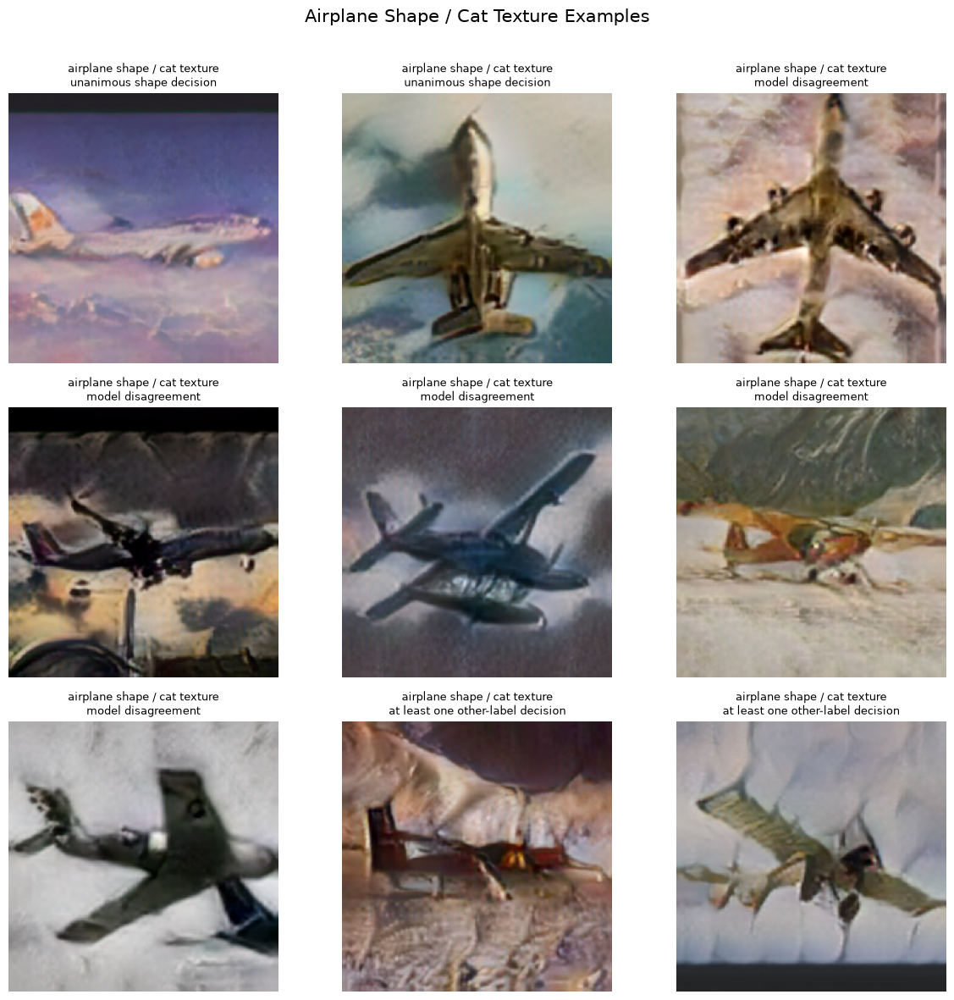

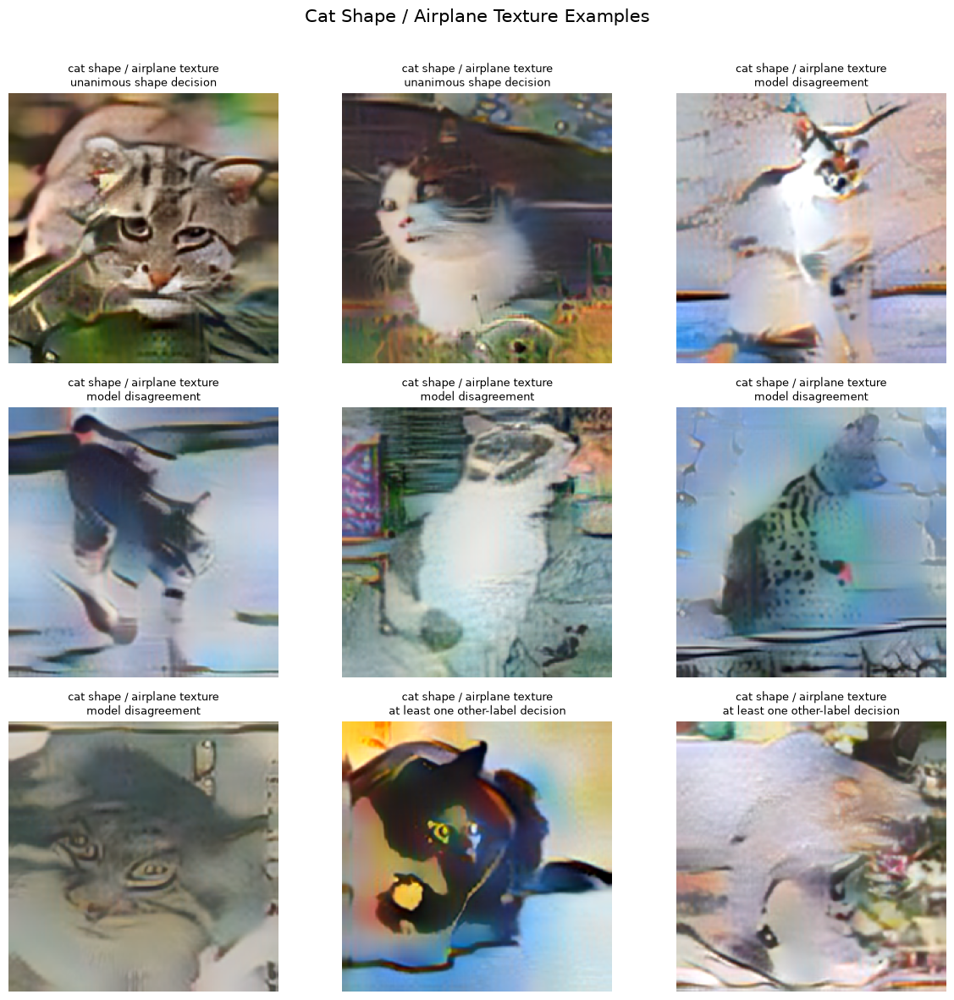

,model,condition,accuracy,macro_f1,mean_max_confidence,accuracy_change,prediction_consistency,macro_f1_change,mean_max_confidence_change
0,ResNet-50 + linear head,clean,0.978,0.978036,0.943872,0.000,1.000,NaN,NaN
1,ResNet-50 + linear head,grayscale,0.958,0.957837,0.939620,-0.020,0.966,-0.020198,-0.004253
2,ResNet-50 + linear head,hue_rotation,0.938,0.937787,0.922382,-0.040,0.944,-0.040249,-0.021490
3,ResNet-50 + linear head,patch_shuffle,0.906,0.906431,0.897004,-0.072,0.922,-0.071604,-0.046868
4,ViT-B/16 + linear head,clean,0.974,0.973916,0.965951,0.000,1.000,NaN,NaN
5,ViT-B/16 + linear head,grayscale,0.956,0.955905,0.961289,-0.018,0.956,-0.018011,-0.004661
6,ViT-B/16 + linear head,hue_rotation,0.944,0.943977,0.936822,-0.030,0.946,-0.029939,-0.029129
7,ViT-B/16 + linear head,patch_shuffle,0.892,0.892426,0.898036,-0.082,0.908,-0.081490,-0.067915
8,CLIP + linear head,clean,0.982,0.981975,0.334370,0.000,1.000,NaN,NaN
9,CLIP + linear head,grayscale,0.954,0.953605,0.307417,-0.028,0.958,-0.028370,-0.026953


,model,shape_count,texture_count,other_count,total_count,shape_bias_percent,coverage_percent
0,ResNet-50 + linear head,115,38,80,233,75.163399,65.665236
1,ViT-B/16 + linear head,169,11,53,233,93.888889,77.253219
2,CLIP + linear head,173,7,53,233,96.111111,77.253219
3,CLIP zero-shot,182,5,46,233,97.326203,80.257511


,model,displacement,accuracy,macro_f1,mean_max_confidence,accuracy_change,macro_f1_change,mean_max_confidence_change,prediction_consistency
0,ResNet-50 + linear head,0,0.9780,0.978036,0.943872,0.0000,0.000000,0.000000,1.0000
1,ResNet-50 + linear head,8,0.9765,0.976551,0.942986,-0.0015,-0.001485,-0.000886,0.9945
2,ResNet-50 + linear head,16,0.9710,0.971065,0.939959,-0.0070,-0.006970,-0.003913,0.9915
3,ResNet-50 + linear head,32,0.9675,0.967643,0.934879,-0.0105,-0.010393,-0.008993,0.9870
4,ViT-B/16 + linear head,0,0.9740,0.973916,0.965951,0.0000,0.000000,0.000000,1.0000
5,ViT-B/16 + linear head,8,0.9770,0.976983,0.965183,0.0030,0.003067,-0.000768,0.9840
6,ViT-B/16 + linear head,16,0.9735,0.973430,0.964399,-0.0005,-0.000486,-0.001552,0.9895
7,ViT-B/16 + linear head,32,0.9645,0.964530,0.959252,-0.0095,-0.009385,-0.006699,0.9735
8,CLIP + linear head,0,0.9820,0.981975,0.334370,0.0000,0.000000,0.000000,1.0000
9,CLIP + linear head,8,0.9805,0.980474,0.331739,-0.0015,-0.001501,-0.002631,0.9855


,backbone,condition,number_of_examples,cosine_stability,standard_deviation,median,minimum,maximum
0,resnet50,grayscale,500,0.788441,0.097823,0.798730,0.301468,1.000000
1,resnet50,cue_conflict,233,0.364129,0.168072,0.356174,0.056445,0.766010
2,resnet50,patch_shuffle,500,0.718113,0.072038,0.720603,0.445369,0.884667
3,resnet50,translation_8_up,500,0.969208,0.014400,0.972052,0.867109,0.990853
4,resnet50,translation_8_down,500,0.965526,0.018488,0.969343,0.835037,0.993509
5,resnet50,translation_8_left,500,0.973791,0.013903,0.976783,0.911244,0.994439
6,resnet50,translation_8_right,500,0.965598,0.021775,0.971609,0.855511,0.993121
7,resnet50,translation_16_up,500,0.955915,0.023934,0.961161,0.792013,0.988331
8,resnet50,translation_16_down,500,0.949303,0.030264,0.956079,0.776195,0.988043
9,resnet50,translation_16_left,500,0.960794,0.022165,0.966219,0.826194,0.991845


,selection_reason,image_identifier,content_label_index,content_class,style_label_index,style_class,output_file,resnet50_linear_prediction_index,resnet50_linear_prediction_class,resnet50_linear_confidence,...,clip_linear_prediction_index,clip_linear_prediction_class,clip_linear_confidence,clip_zero_shot_prediction_index,clip_zero_shot_prediction_class,clip_zero_shot_confidence,resnet50_linear_cue,vit_b_16_linear_cue,clip_linear_cue,clip_zero_shot_cue
0,unanimous shape decision,shape_airplane_texture_cat_018,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,0,airplane,0.615389,...,0,airplane,0.243959,0,airplane,0.946634,shape,shape,shape,shape
1,unanimous shape decision,shape_airplane_texture_cat_023,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,0,airplane,0.986333,...,0,airplane,0.301152,0,airplane,0.937552,shape,shape,shape,shape
2,model disagreement,shape_airplane_texture_cat_000,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,4,deer,0.715340,...,0,airplane,0.208985,0,airplane,0.775599,other,shape,shape,shape
3,model disagreement,shape_airplane_texture_cat_004,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,4,deer,0.679290,...,0,airplane,0.333030,0,airplane,0.977878,other,shape,shape,shape
4,model disagreement,shape_airplane_texture_cat_005,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,1,bird,0.884920,...,0,airplane,0.300465,0,airplane,0.915544,other,shape,shape,shape
5,model disagreement,shape_airplane_texture_cat_006,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,1,bird,0.871818,...,0,airplane,0.147096,1,bird,0.360136,other,shape,shape,other
6,model disagreement,shape_airplane_texture_cat_009,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,6,horse,0.394191,...,0,airplane,0.306483,0,airplane,0.881826,other,shape,shape,shape
7,at least one other-label decision,shape_airplane_texture_cat_003,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,4,deer,0.610254,...,6,horse,0.119713,6,horse,0.356574,other,other,other,other
8,at least one other-label decision,shape_airplane_texture_cat_008,0,airplane,3,cat,Data/task1_cache/cue_conflicts/candidates/shap...,1,bird,0.998761,...,1,bird,0.197255,1,bird,0.853121,other,other,other,other
9,unanimous shape decision,shape_cat_texture_airplane_006,3,cat,0,airplane,Data/task1_cache/cue_conflicts/candidates/shap...,3,cat,0.936440,...,3,cat,0.319959,3,cat,0.959807,shape,shape,shape,shape


Machine-readable metrics: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\metrics
Predictions and examples: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\predictions
Figures: C:\Users\DanishZaheer\Desktop\LUMS\Semester_3\ATML\PA_1\task1\results\figures


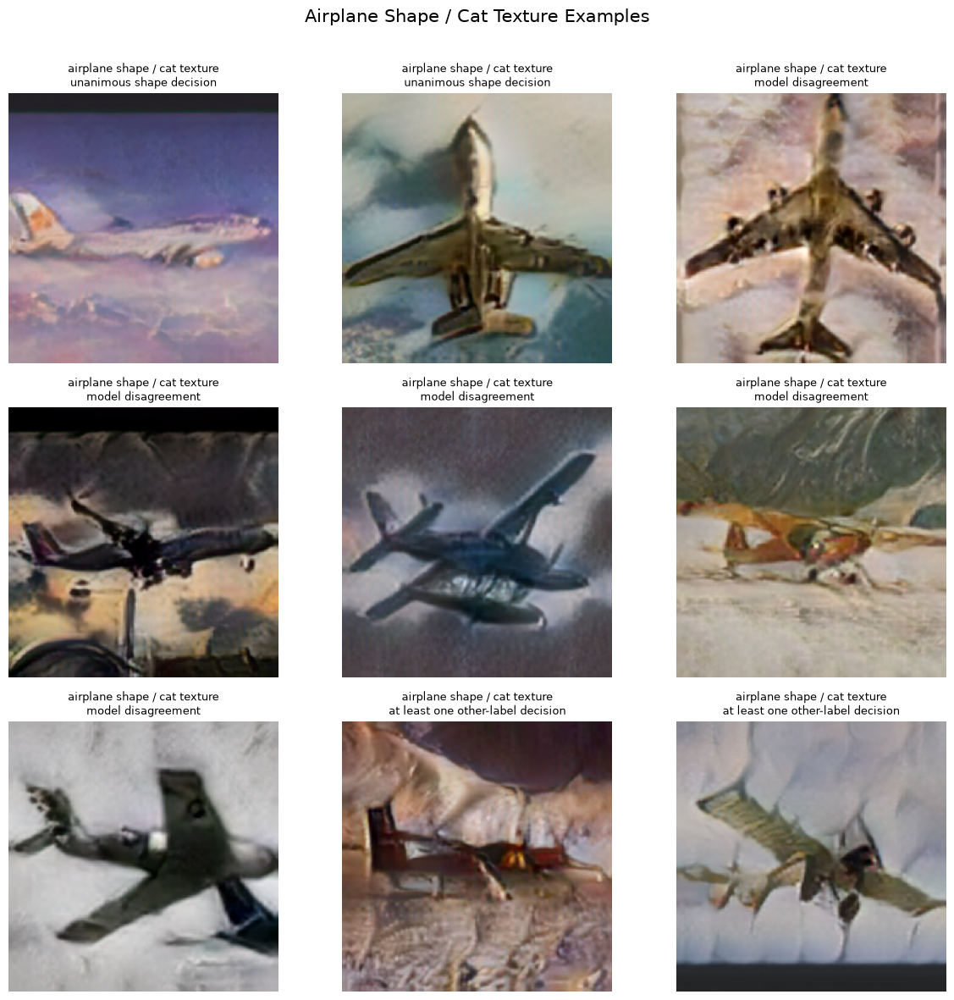

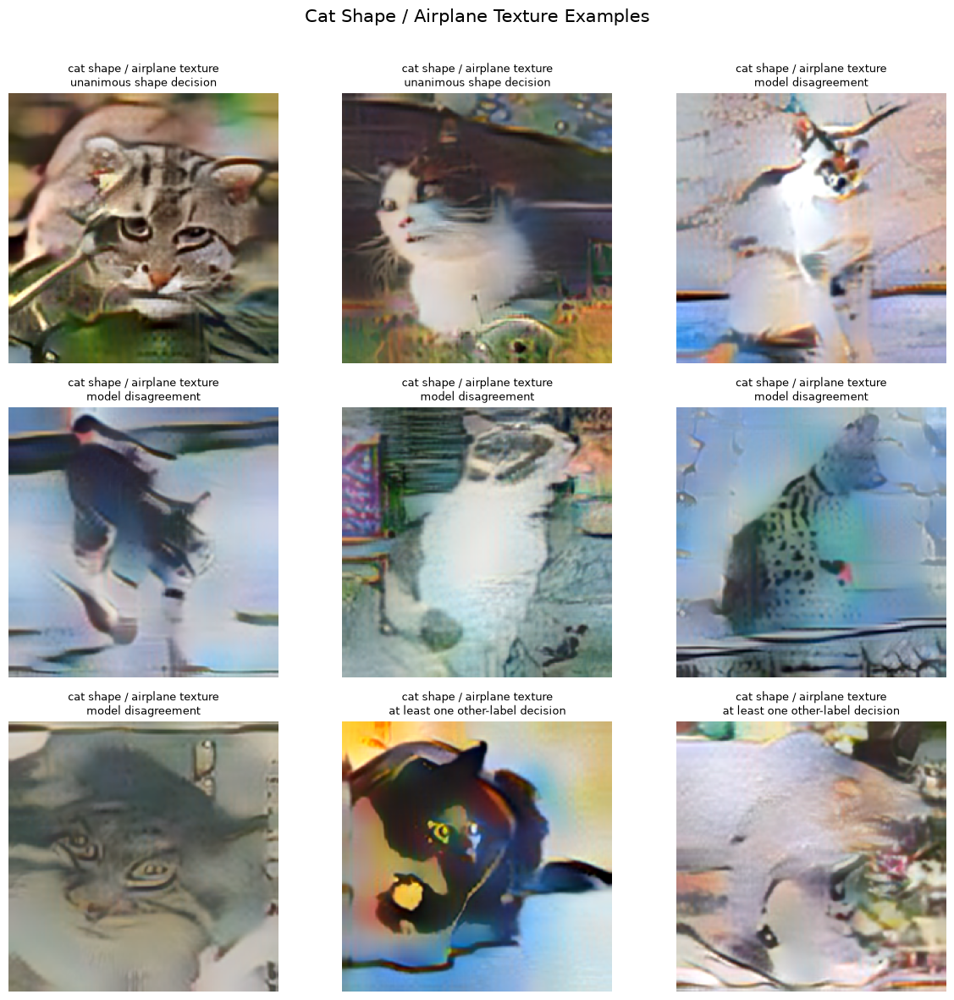

In [288]:
# Build and display all final tables, two cue grids, and saved figures.
# Print output directories and warn if hypothesis placeholders remain.

COMPACT_PERFORMANCE_TABLE = build_compact_performance_table()
CUE_RESULTS_TABLE = build_cue_results_table()
INFORMATIVE_EXAMPLE_GROUPS = build_informative_examples()
FAILURE_EXAMPLES = pd.concat(
    INFORMATIVE_EXAMPLE_GROUPS.values(),
    ignore_index=True,
)
FAILURE_EXAMPLE_FIGURES = plot_informative_examples(
    INFORMATIVE_EXAMPLE_GROUPS
)

for figure in FAILURE_EXAMPLE_FIGURES.values():
    display(figure)

display(COMPACT_PERFORMANCE_TABLE)
display(CUE_RESULTS_TABLE)
display(TRANSLATION_TABLE)
display(stability_table)
display(FAILURE_EXAMPLES)

print(f'Machine-readable metrics: {METRICS_DIR}')
print(f'Predictions and examples: {PREDICTIONS_DIR}')
print(f'Figures: {FIGURES_DIR}')

if any(value.startswith('TODO') for value in HYPOTHESES.values()):
    print('WARNING: replace the hypothesis TODOs before using these results.')

Unanimous shape decision: All four predictors classified the image as airplane. This is evidence that the preserved shape dominated the cat-derived texture.

Model disagreement: The four predictors did not select the same cue. Some predicted airplane, cat, or another class, showing different cue reliance between models.

At least one other-label decision: At least one model predicted neither airplane nor cat. This indicates that the stylization produced ambiguous evidence and contributes to reduced coverage.